Import Python libraries

In [1]:
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import pandas as pd
import matplotlib.pyplot as plt
import glob
import pyresample

Define SAL file path

In [2]:
SALfiles = glob.glob('path + file')

Defining the saving path

In [3]:
Save_path = 'path'

Define the  maximum overpass length

In [5]:
max_overpass_length = 12000

Open SAL and TOA files, choose correct albedo values, substract TOA albedo from SAL, mask and reproject the results, save them separately in DataArrays and then and add the arrays in a single DataSet.

20120604_0000
DIFF PLOT


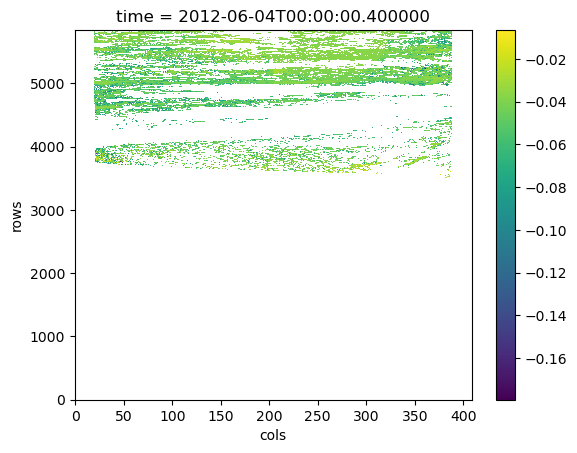

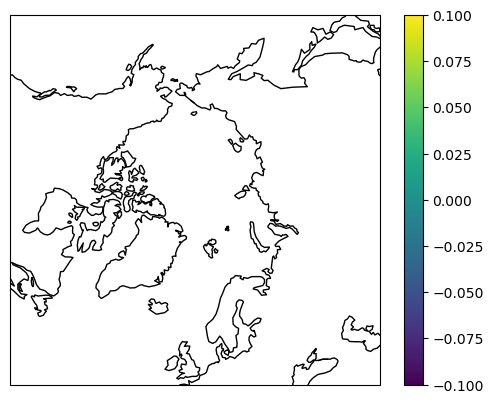

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Diff_alb_SAL_TOA' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


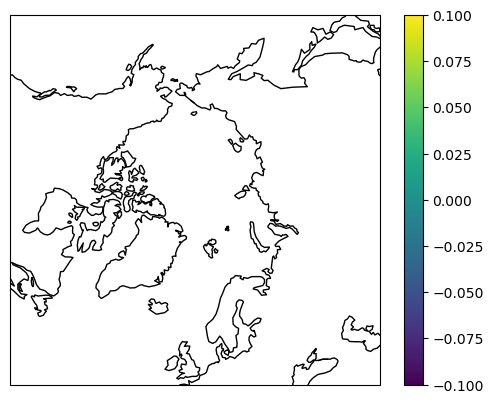

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'TOA_alb' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


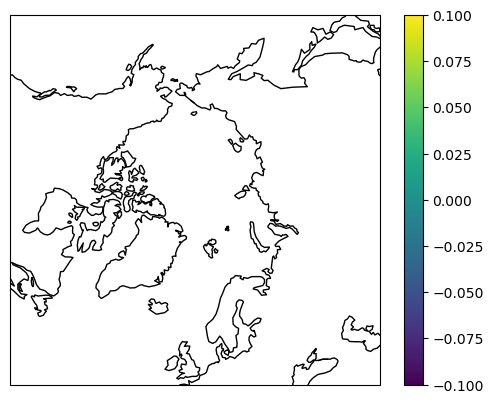

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'SAL_alb' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


In [6]:
#Create lists for data

combined_list_albedo = []
masks = []

for SALfile in SALfiles:
    try:

        #Open SAL file, create a mask and a timestamp based on the filename
        
        SAL = xr.open_dataset(SALfile)
        SAL_alb = (SAL['bb_albedo'] + SAL['bb_snow_reflectance'])/100.
        SAL_alb = SAL_alb.where(SAL_alb>0, np.nan).squeeze()[0:max_overpass_length,:]
        
        SAL2 = ~np.isnan(SAL_alb)
        SAL3 = np.array(SAL2) + 0
        SAL4 = np.where(SAL3>0, 1.0, np.nan).squeeze()
        SALtime = pd.to_datetime(SALfile.split('99999_')[1].split('_')[0][:-2])
        print(SALtime.strftime('%Y%m%d_%H%M'))
        timestamp = SALtime.strftime('%Y%m%d_%H%M')



        
        #Open TOA file and create a mask
    
        TOAfile = 'E:/Data_201206/TOA_201206/gac_TOA_201206_noaa19/'+SALtime.strftime('%Y%m%d') + '/TOA_flux' + SALfile.split('S_NWC')[1].split('_bb_')[0] + '.nc'
        TOA = xr.open_dataset(TOAfile)
        TOA = TOA.rename_dims({'ny':'rows','nx':'cols'})
        TOA_alb = (TOA['SW_albedo'].squeeze())/100.
        TOA_alb = TOA_alb.where(TOA_alb>0, np.nan).squeeze()[0:max_overpass_length,:]
        TOA2 = ~np.isnan(TOA_alb)
        TOA3 = np.array(TOA2) + 0
        TOA4 = np.where(TOA3>0, 1.0, np.nan).squeeze()[0:max_overpass_length,:]
        

        

        
        #Substract TOA albedo from SAL
    
        diff_TOA_surf = SAL_alb - TOA_alb
        diff_TOA_surf_mask = diff_TOA_surf*SAL4*TOA4
        print("DIFF PLOT")
        diff_TOA_surf.plot()
        plt.show()

        masks.append(SAL4*TOA4)

        
        #Reproject the result in a EASE2 projection
        
        tgt  = pyresample.area_config.create_area_def('nhease2', 'epsg:6931', width=360, height=360, resolution=25000, area_extent= (-4487500.0, -4487500.0, 4487500.0, 4487500.0))
    
        tgt_lon, tgt_lat = tgt.get_lonlats()
    
        source = pyresample.SwathDefinition(lats=diff_TOA_surf_mask['lat'].squeeze(), lons=diff_TOA_surf_mask['lon'].squeeze())
        reproj_diff = pyresample.kd_tree.resample_nearest(source, diff_TOA_surf_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
        reproj_diff 
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_diff, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    

        
    
        #reproj_diff.to_netcdf(timestamp + '.nc')
    
        reproj_diff_xr = xr.DataArray(reproj_diff, dims=(('y','x')))
        print(reproj_diff_xr)
        reproj_diff_xr['time'] = SALtime
        reproj_diff_xr['lon'] = (('y','x'), tgt_lon)
        reproj_diff_xr['lat'] = (('y','x'), tgt_lat)
        reproj_diff_xr.name = 'Diff_alb_SAL_TOA'
        print(reproj_diff_xr)
    



        
        #TOA data masking and reprojection
    
        TOA_alb_mask = TOA_alb*TOA4*SAL4
    
        source = pyresample.SwathDefinition(lats=TOA_alb_mask['lat'].squeeze(), lons=TOA_alb_mask['lon'].squeeze())
    
        reproj_TOA_mask = pyresample.kd_tree.resample_nearest(source, TOA_alb_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_TOA_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_TOA_mask_xr = xr.DataArray(reproj_TOA_mask, dims=(('y','x')))
        print(reproj_TOA_mask_xr)
        reproj_TOA_mask_xr['time'] = SALtime
        reproj_TOA_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_TOA_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_TOA_mask_xr.name = 'TOA_alb'
        print(reproj_TOA_mask_xr)
    
    

        
        #SAL data masking and reprojection
    
    
        SAL_alb_mask = SAL_alb*TOA4*SAL4
    
        source = pyresample.SwathDefinition(lats=SAL['latitude'].squeeze()[0:max_overpass_length,:], lons=SAL['longitude'].squeeze()[0:max_overpass_length,:])
    
        reproj_SAL_mask = pyresample.kd_tree.resample_nearest(source, SAL_alb_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)

    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_SAL_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_SAL_mask_xr = xr.DataArray(reproj_SAL_mask, dims=(('y','x')))
        print(reproj_SAL_mask_xr)
        reproj_SAL_mask_xr['time'] = SALtime
        reproj_SAL_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_SAL_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_SAL_mask_xr.name = 'SAL_alb'
        print(reproj_SAL_mask_xr)
        


        
    #If reading or reprojection fails, save the file name in a separate list. Add empty DataArray to the Dataset. Raise can also be used to find possible errors
         

    except Exception:
        print("BROKEN", timestamp)
        save_path2 = 'path'
        with open(save_path2 + 'Broken_data_SAL_TOA.txt', 'a') as f:
            f.write(",")
            f.write(timestamp)
            f.close()
        EmptyArray = xr.DataArray(np.ones(tgt_lon.shape)*np.nan, dims=['y','x'])
        EmptyArray['time'] = SALtime
        EmptyArray['lon'] = (('y','x'), tgt_lon)
        EmptyArray['lat'] = (('y','x'), tgt_lat)
        combined_list_albedo.append(EmptyArray)
        continue



    #Combine three DataArrays into one Dataset

    
    combine_albedo_data_xr = xr.merge([reproj_diff_xr, reproj_TOA_mask_xr, reproj_SAL_mask_xr])

    combined_list_albedo.append(combine_albedo_data_xr)

    

Open file containing geometry variables (PPS file), choose desired values, use masks to aquire the correct data, reproject results and save them in DataSet

C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T0000004Z_20120604T0048399Z.nc
Sun Azimuth


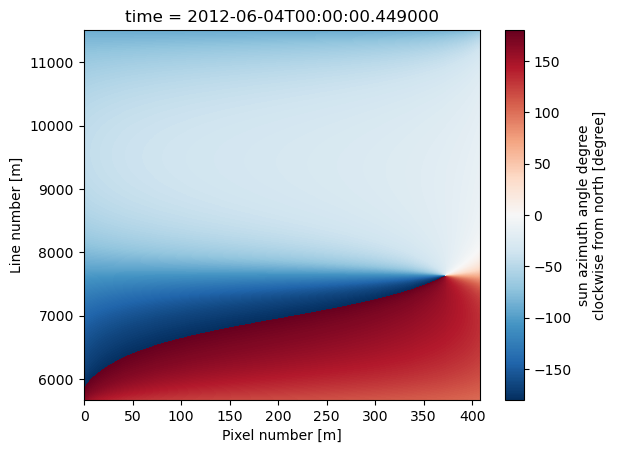

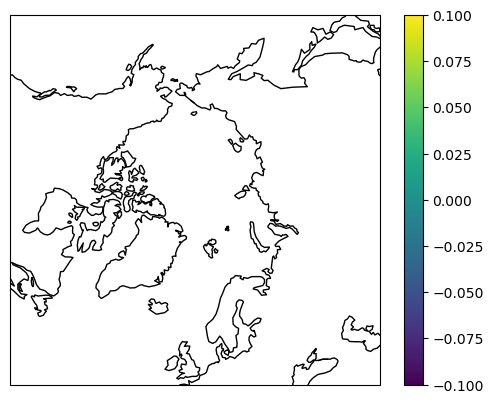

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


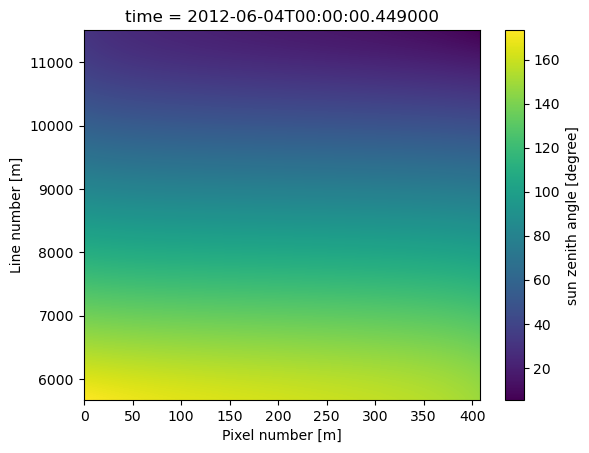

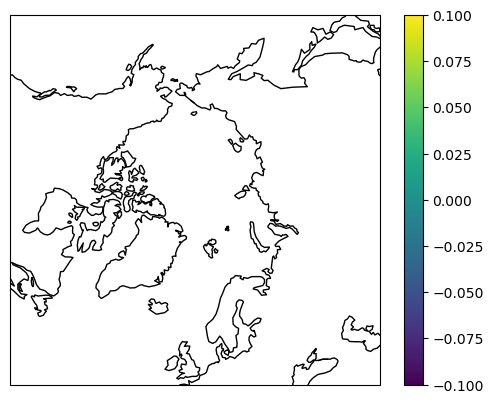

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


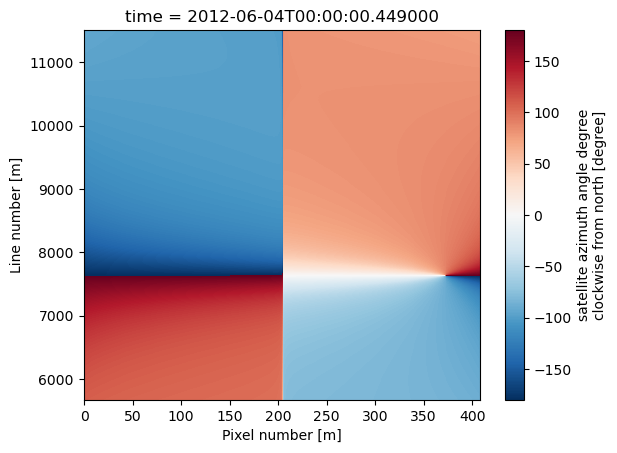

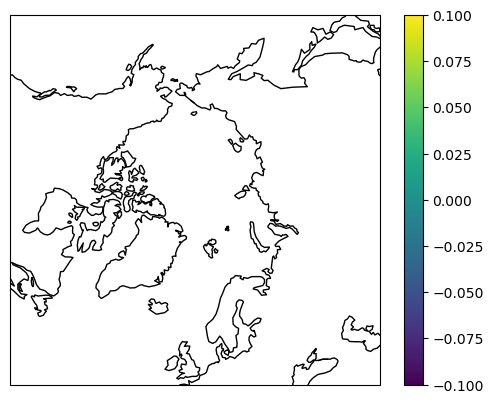

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


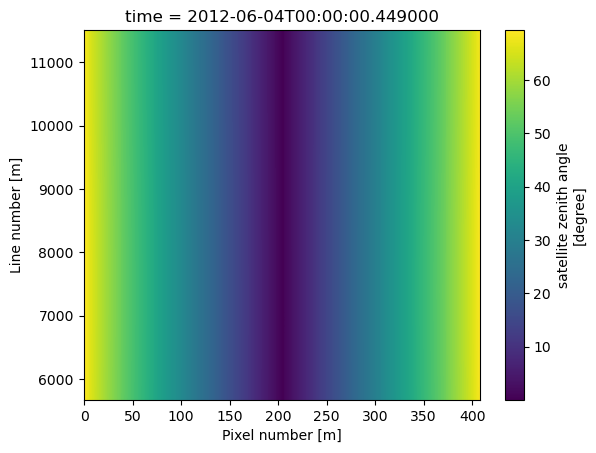

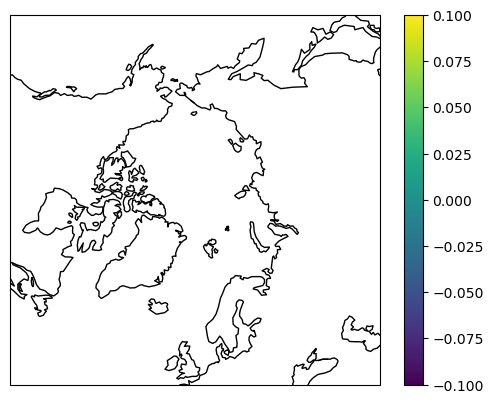

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T0048404Z_20120604T0237549Z.nc
Sun Azimuth


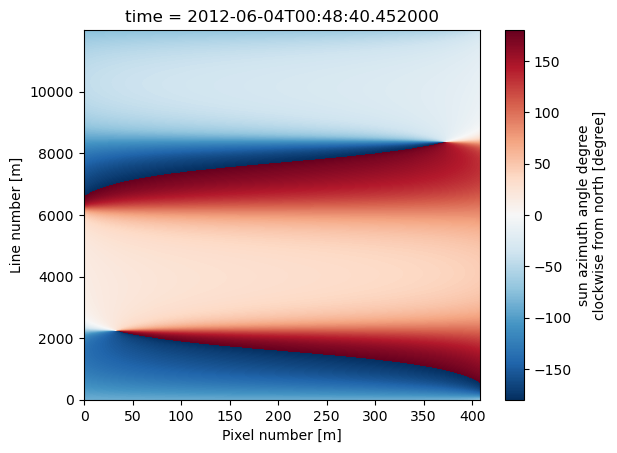

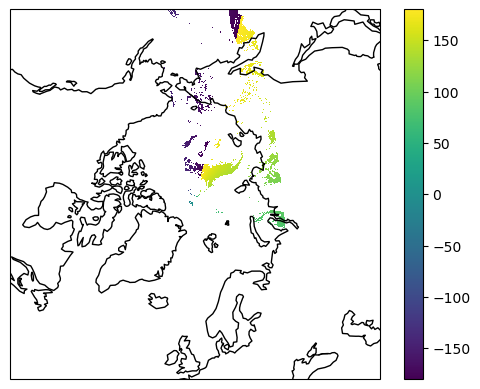

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T00:48:40
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


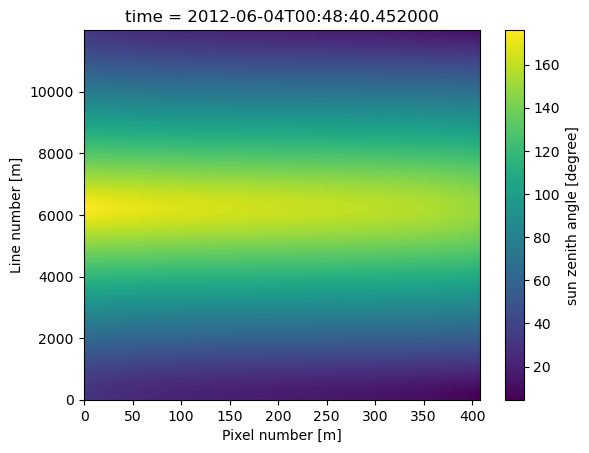

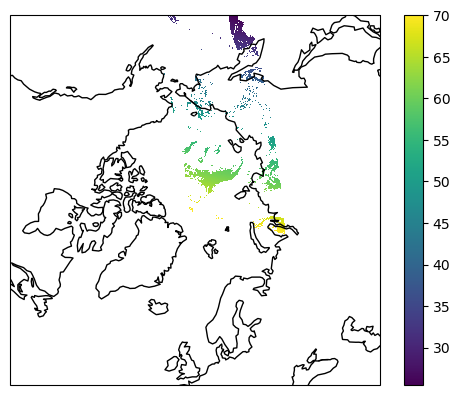

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T00:48:40
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


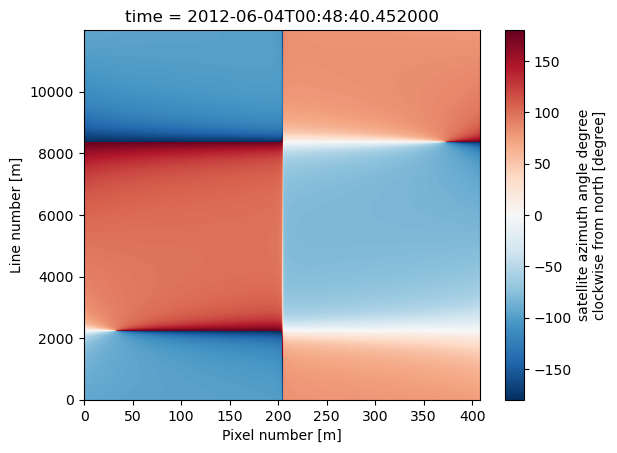

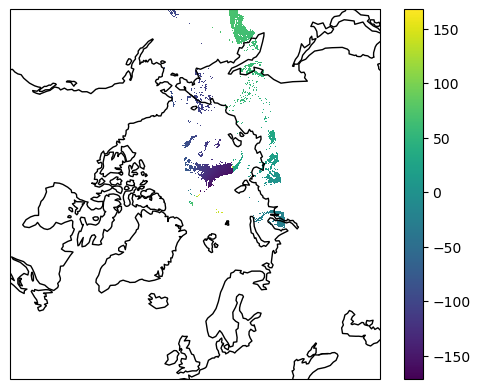

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T00:48:40
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


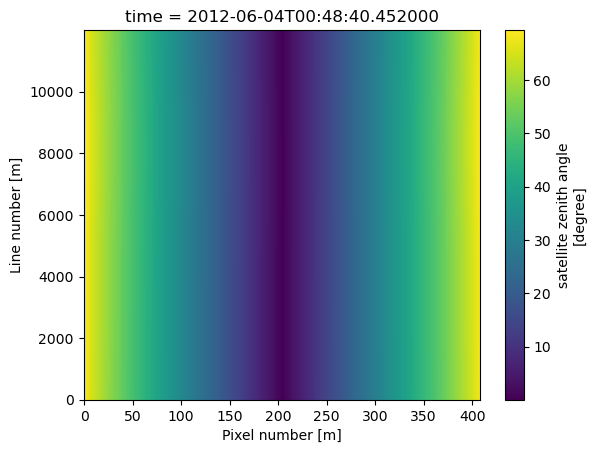

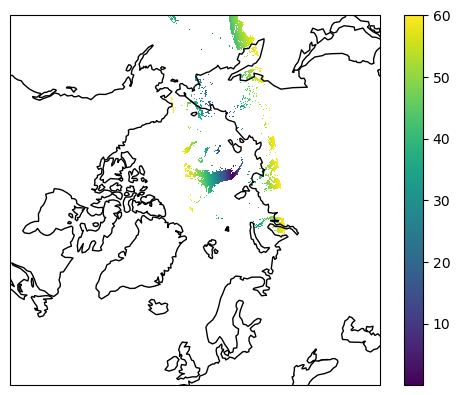

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T00:48:40
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T0237554Z_20120604T0419389Z.nc
Sun Azimuth


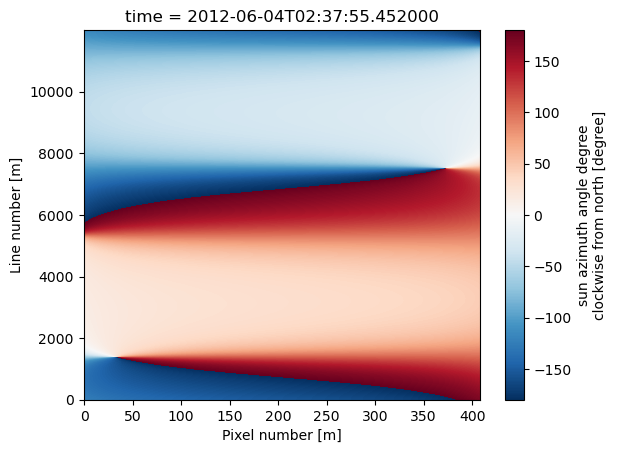

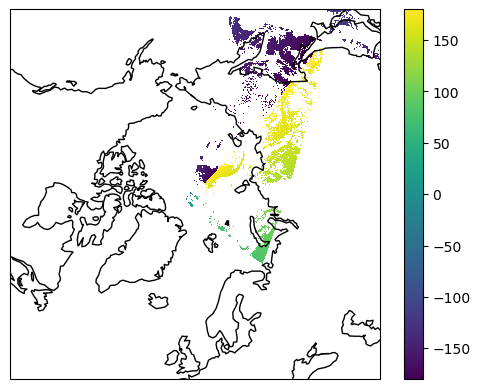

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T02:37:55
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


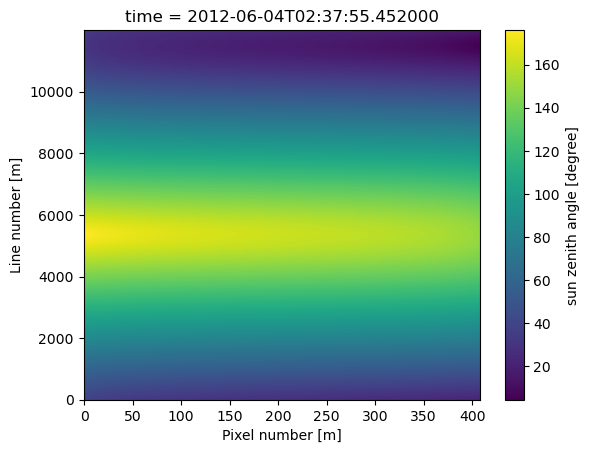

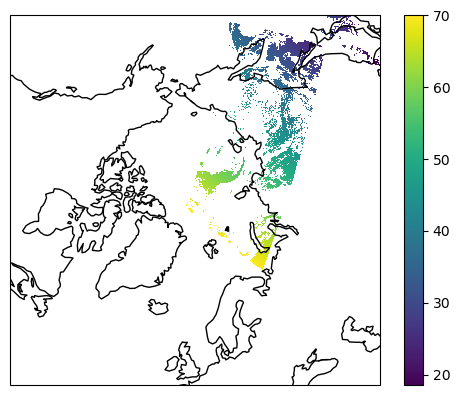

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T02:37:55
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


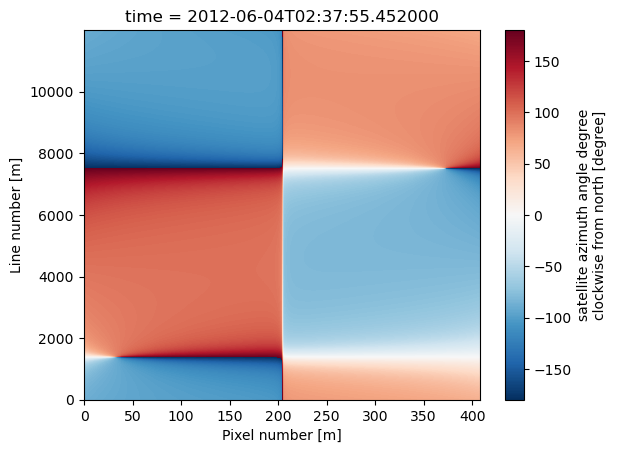

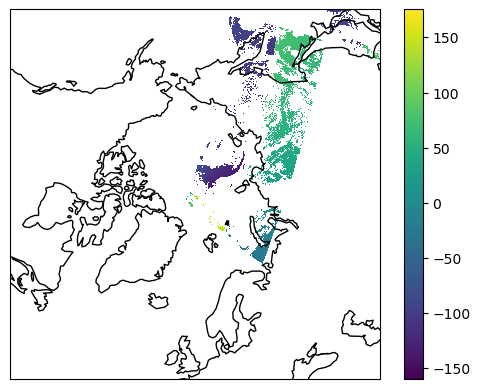

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T02:37:55
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


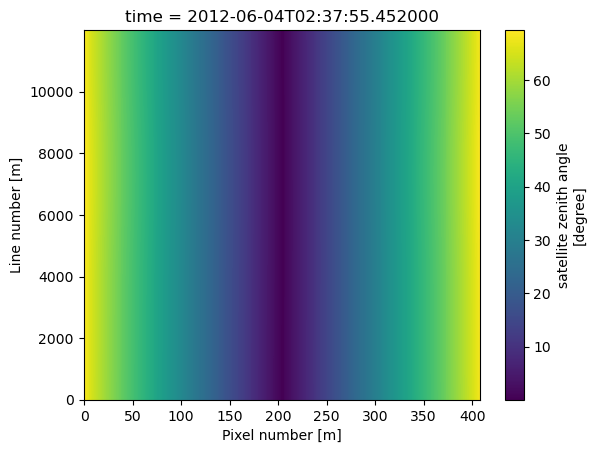

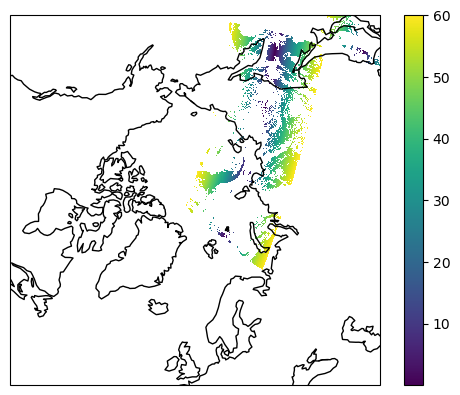

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T02:37:55
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T0419394Z_20120604T0608539Z.nc
Sun Azimuth


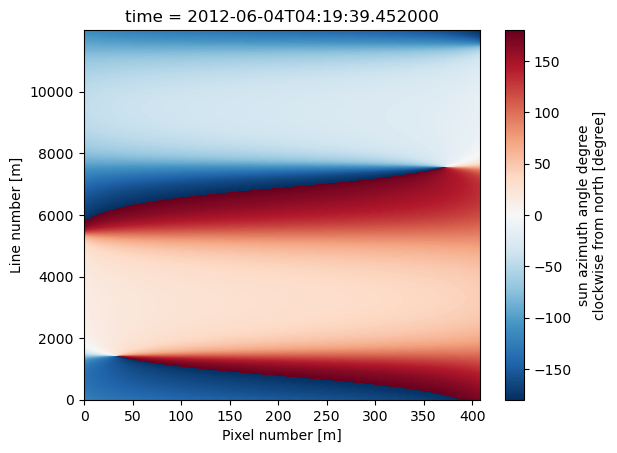

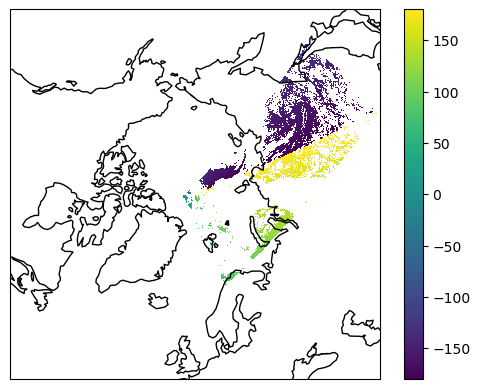

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T04:19:39
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


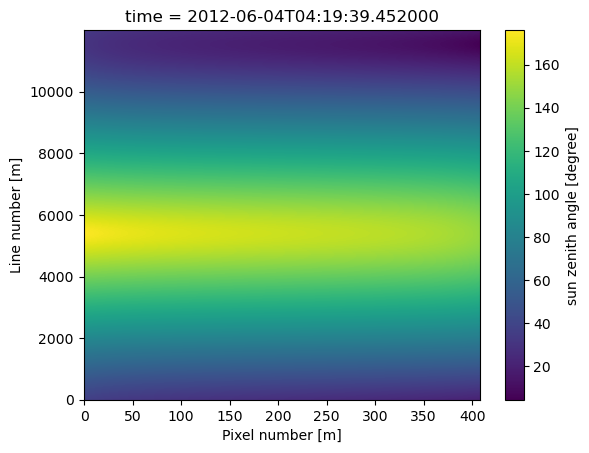

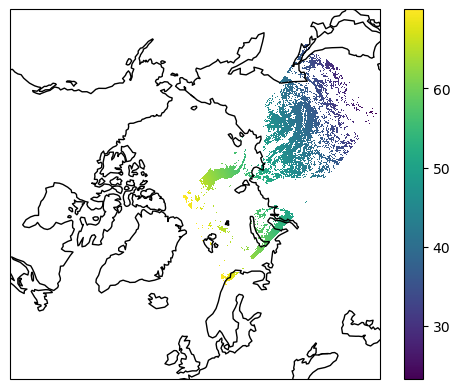

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T04:19:39
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


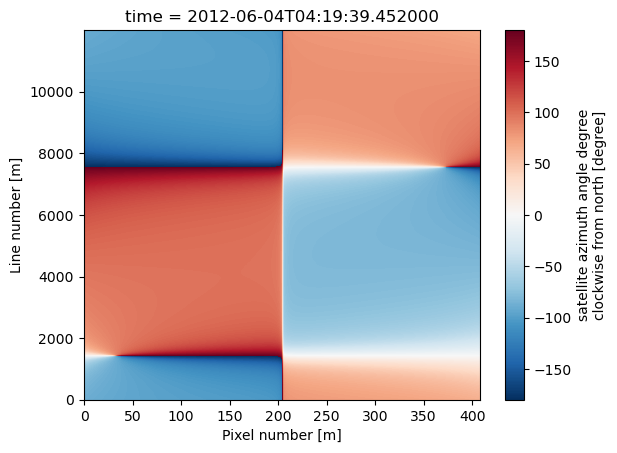

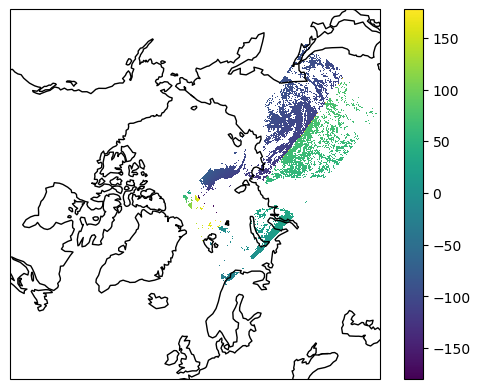

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T04:19:39
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


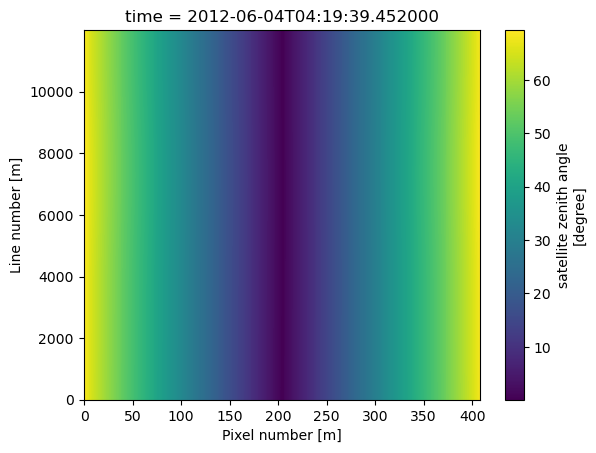

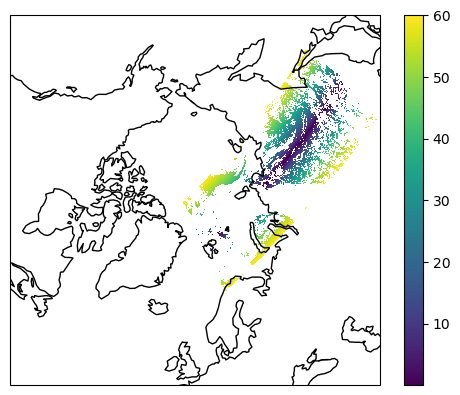

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T04:19:39
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T0608544Z_20120604T0756289Z.nc
Sun Azimuth


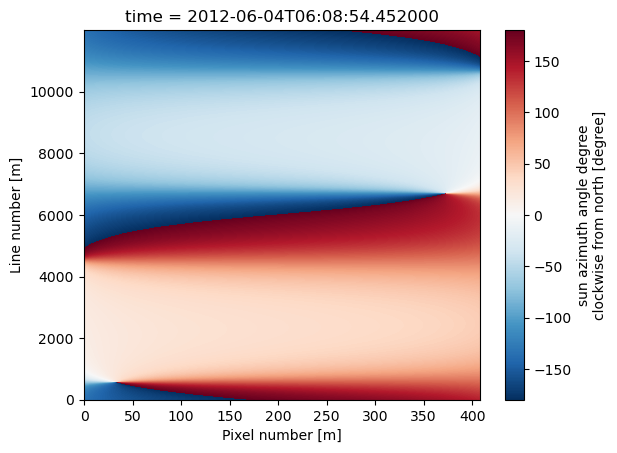

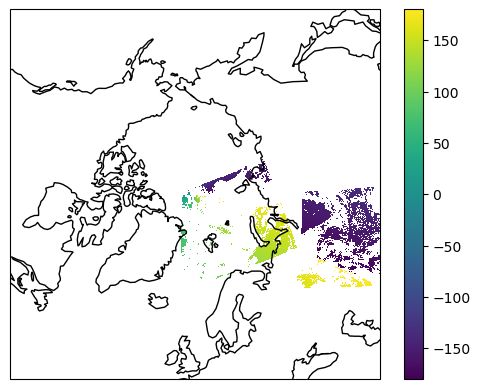

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T06:08:54
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


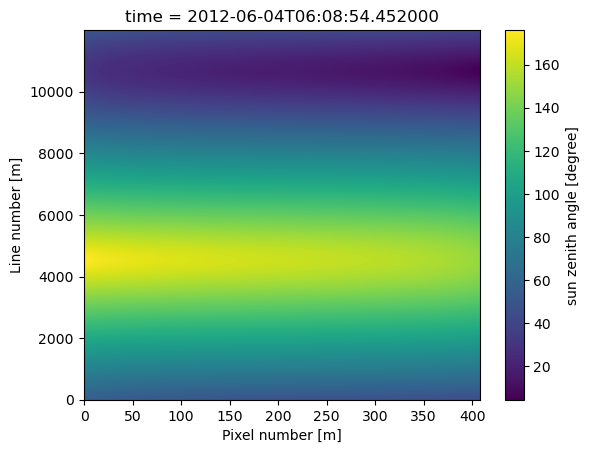

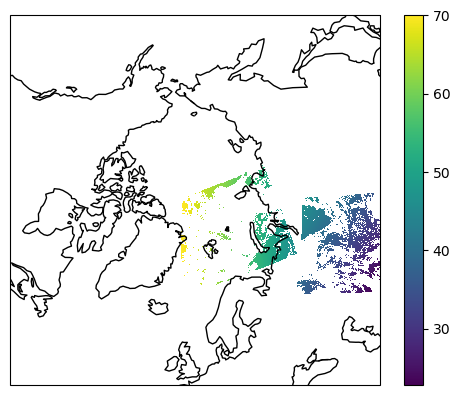

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T06:08:54
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


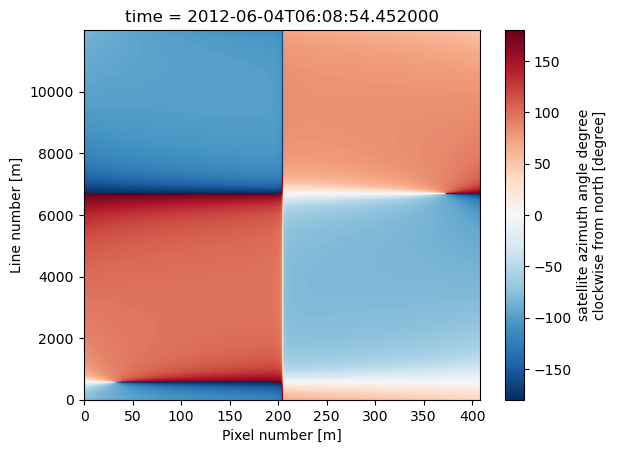

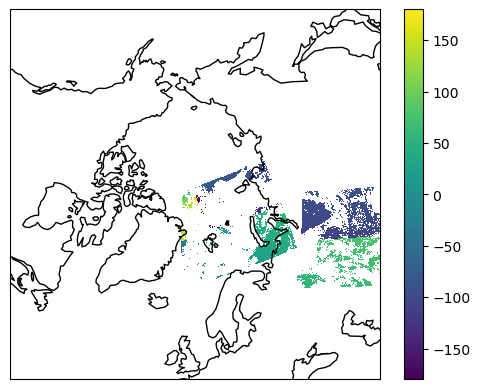

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T06:08:54
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


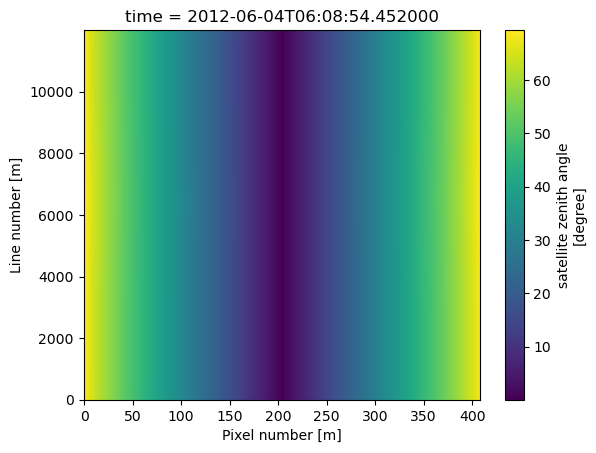

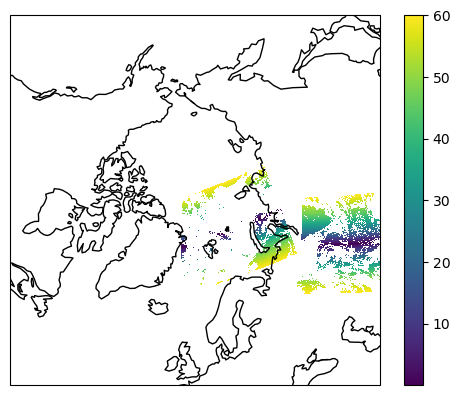

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T06:08:54
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T0756294Z_20120604T0932489Z.nc
Sun Azimuth


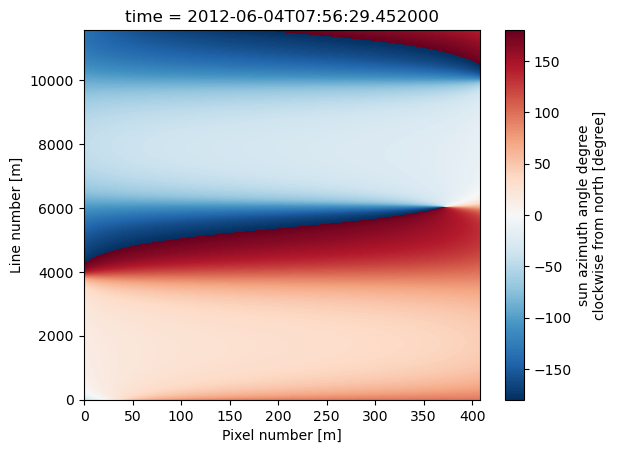

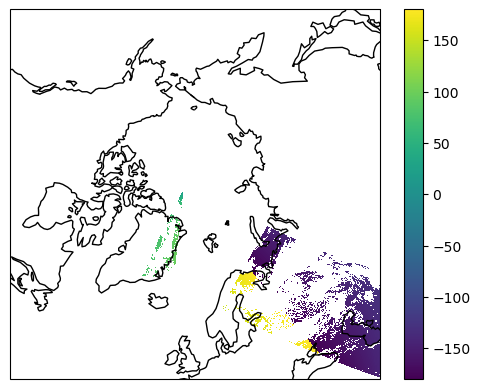

<xarray.DataArray (y: 360, x: 360)>
array([[          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       ...,
       [          nan,           nan,           nan, ..., -147.5       ,
        -146.59999084, -145.17999268],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
       

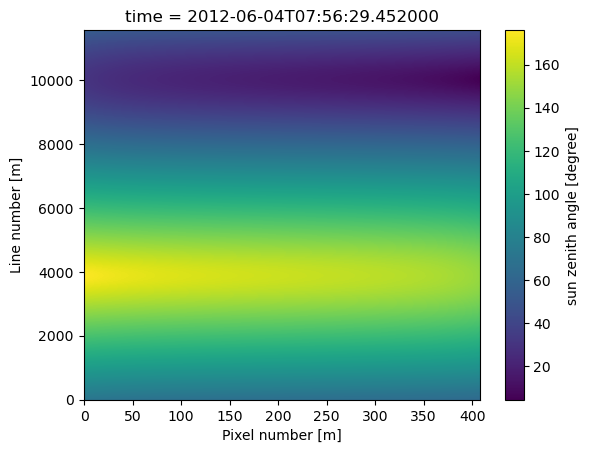

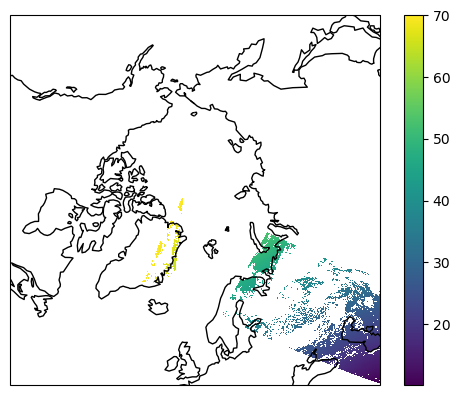

<xarray.DataArray (y: 360, x: 360)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [        nan,         nan,         nan, ..., 10.2699995 ,
        10.13999939, 10.09999943],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,


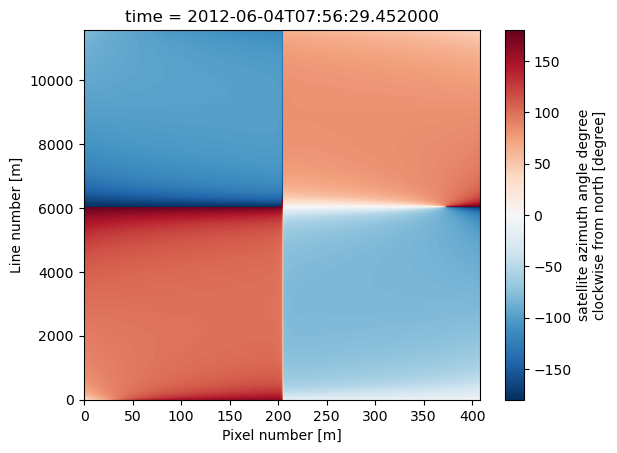

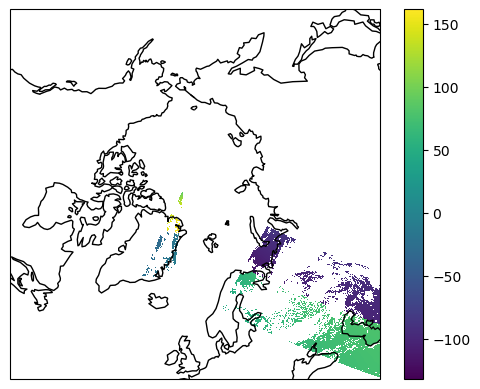

<xarray.DataArray (y: 360, x: 360)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [        nan,         nan,         nan, ..., 73.34999847,
        73.41999817, 73.55999756],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,       

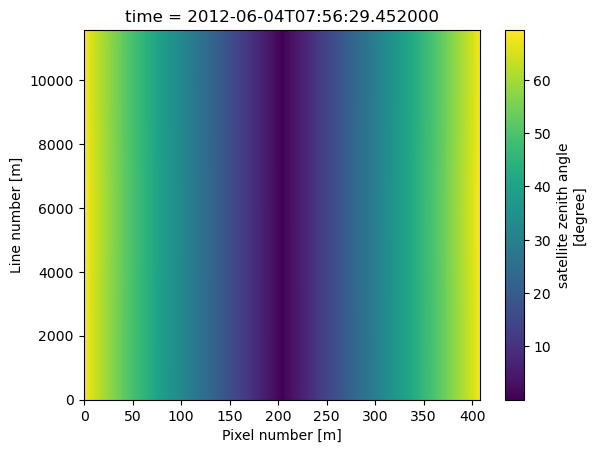

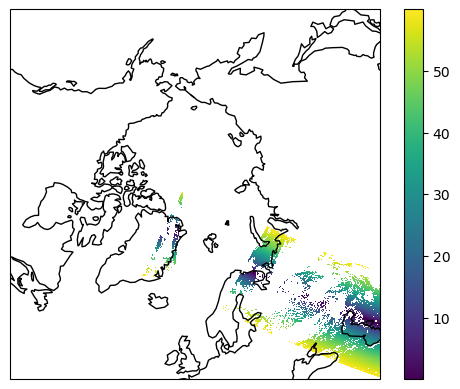

<xarray.DataArray (y: 360, x: 360)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [        nan,         nan,         nan, ..., 59.80999756,
        59.80999756, 59.40999985],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,        

C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T0932494Z_20120604T1113489Z.nc
Sun Azimuth


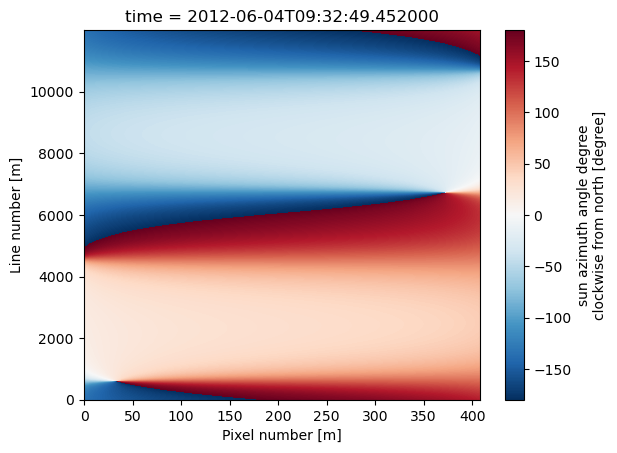

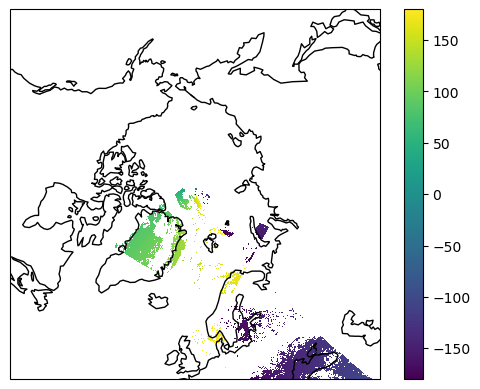

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T09:32:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


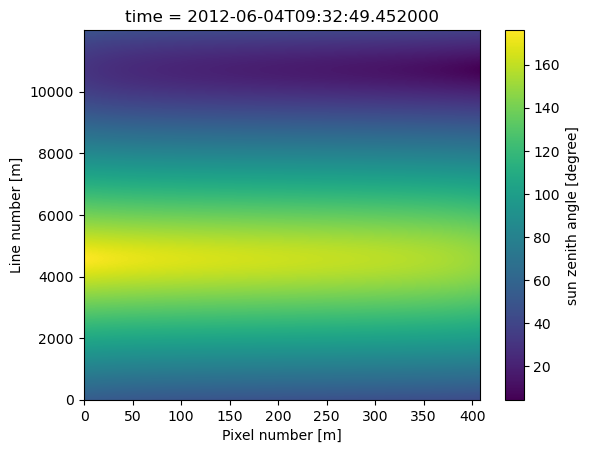

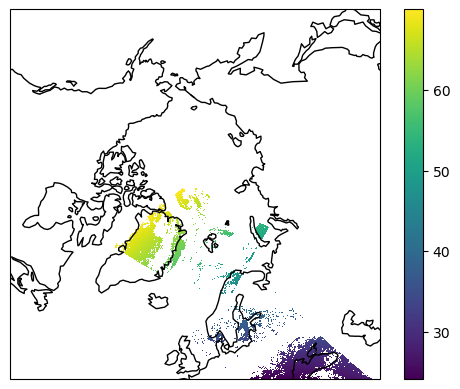

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T09:32:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


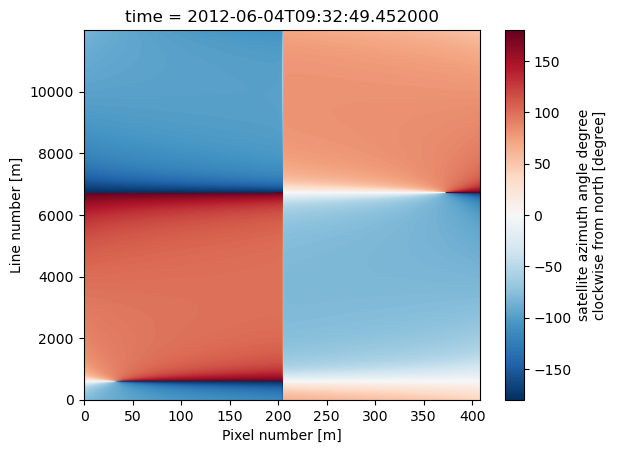

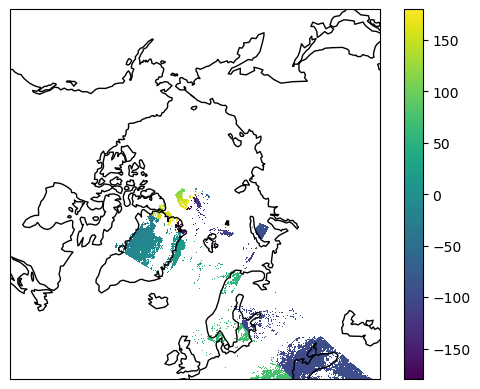

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T09:32:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


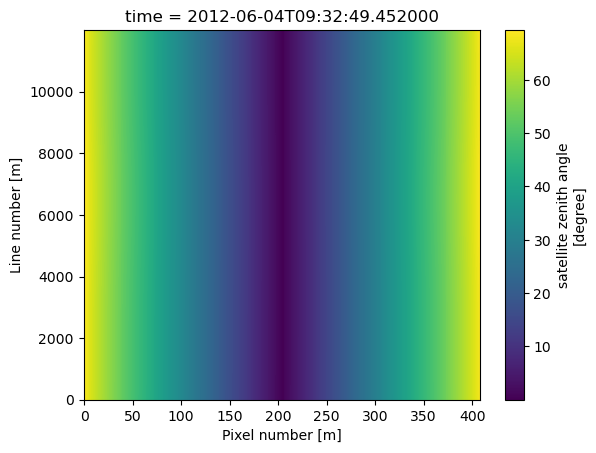

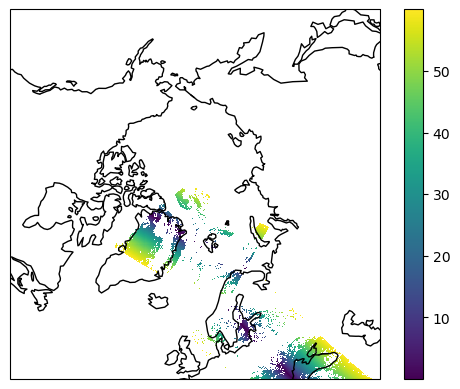

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T09:32:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T1113494Z_20120604T1254489Z.nc
Sun Azimuth


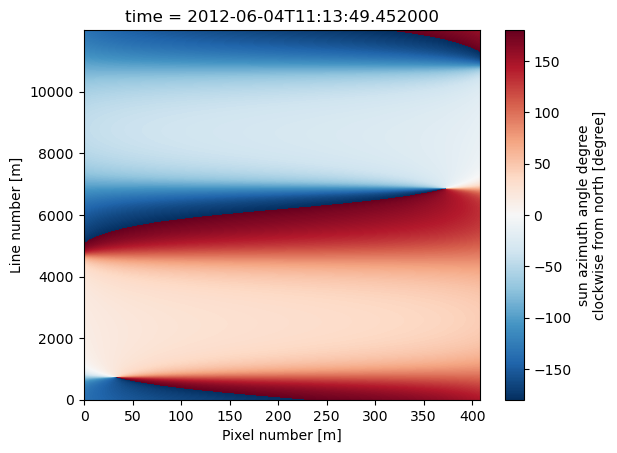

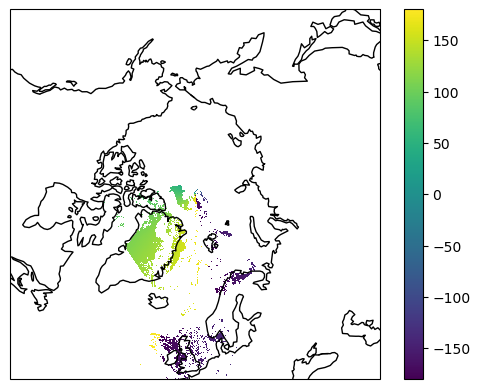

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T11:13:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


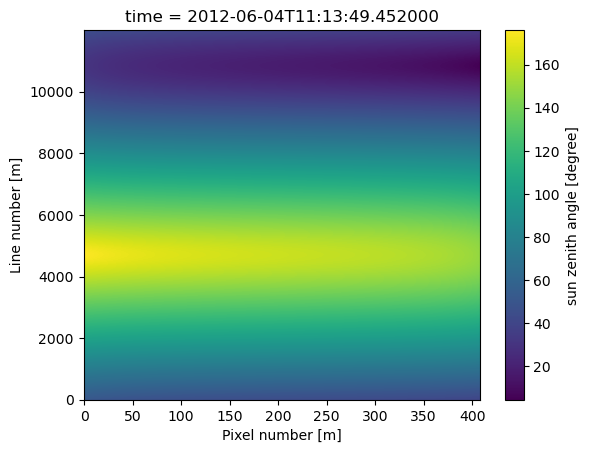

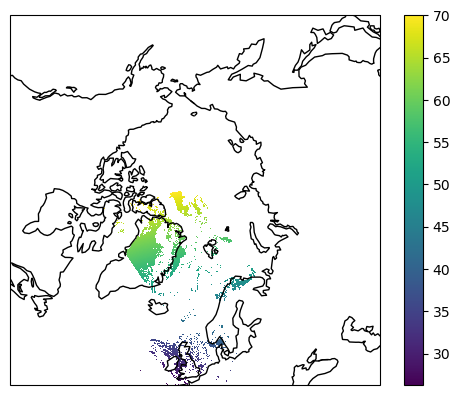

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T11:13:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


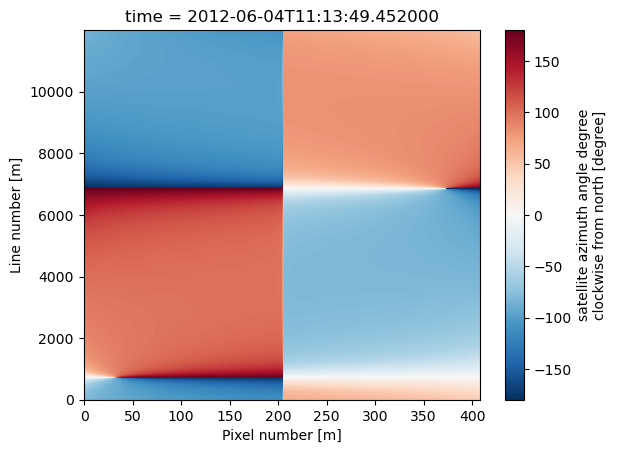

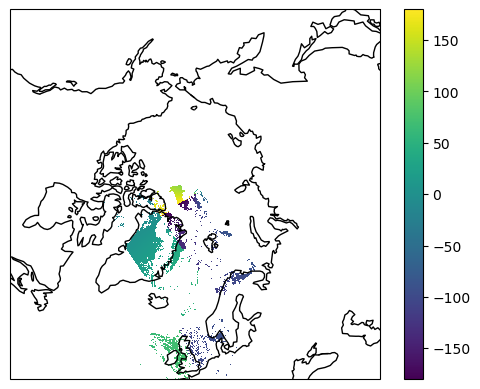

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T11:13:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


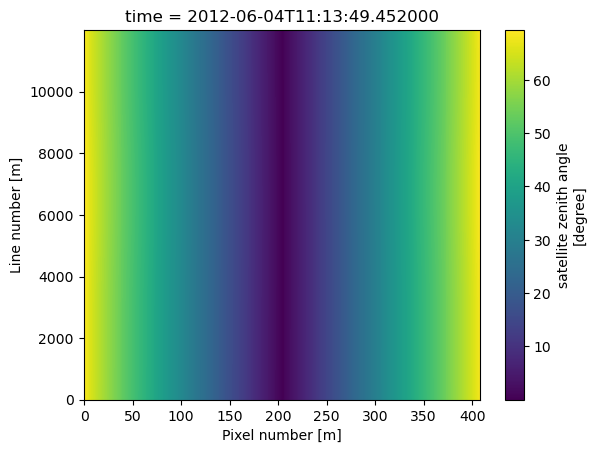

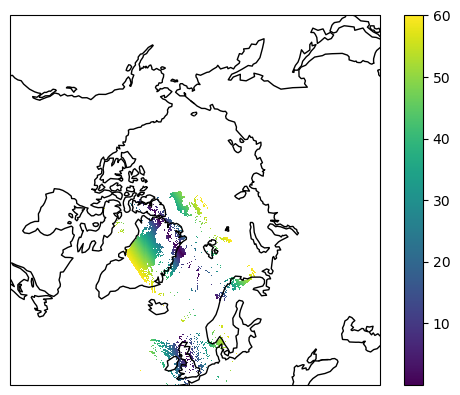

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T11:13:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T1254494Z_20120604T1435289Z.nc
Sun Azimuth


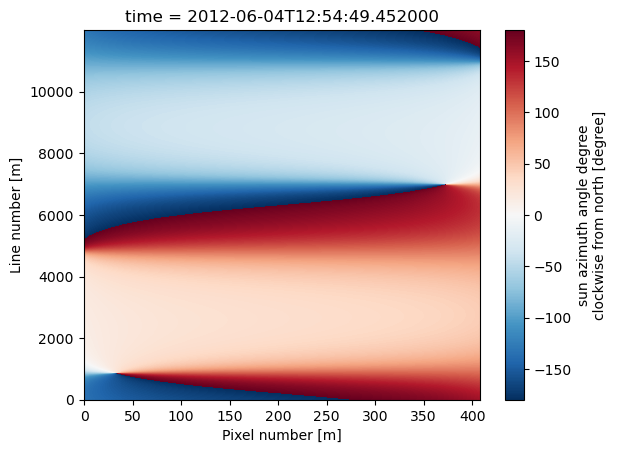

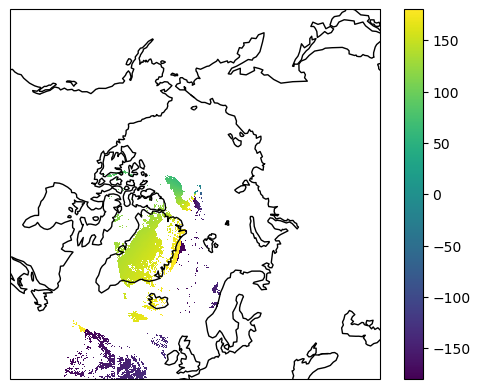

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T12:54:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


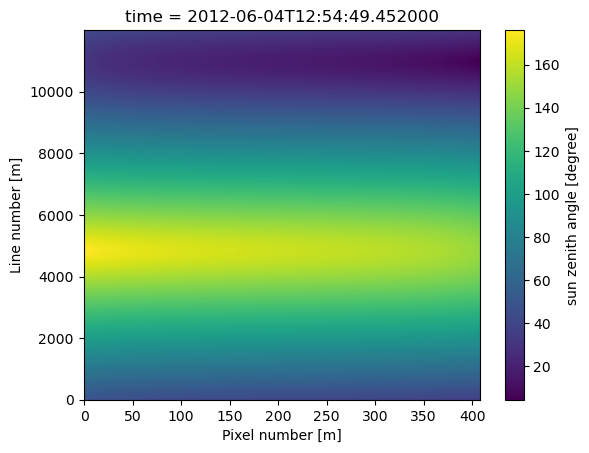

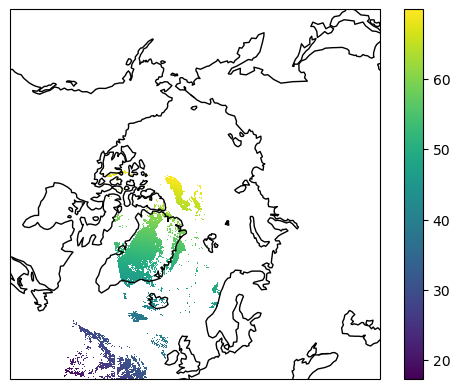

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T12:54:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


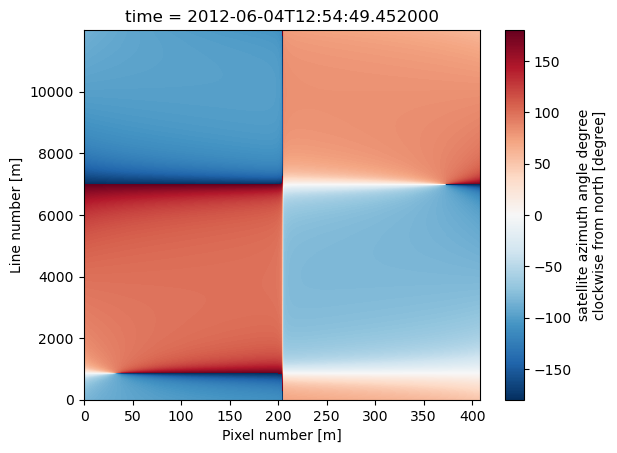

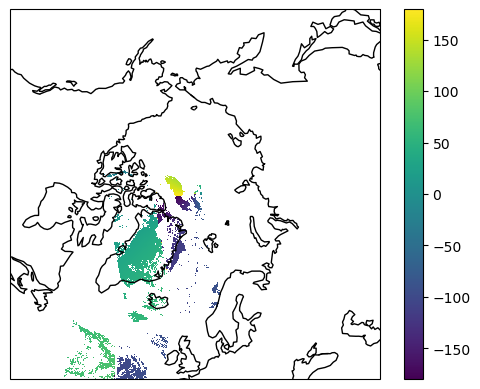

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T12:54:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


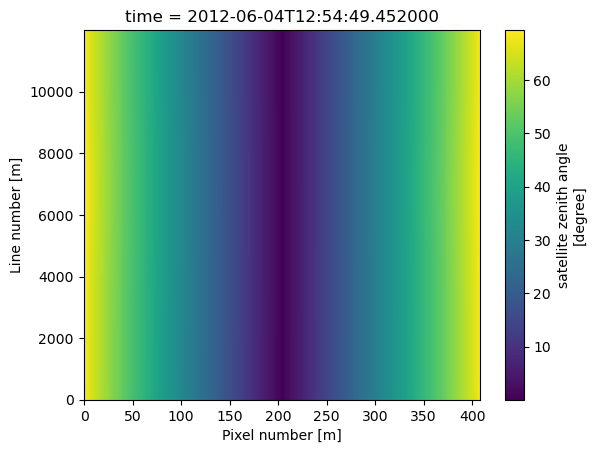

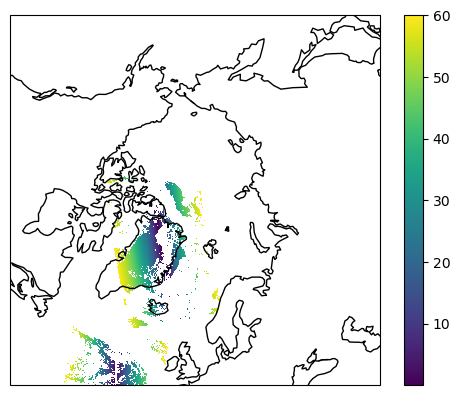

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T12:54:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
did not find a match in any of xarray's currently installed IO ba

C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T1615394Z_20120604T1740289Z.nc
Sun Azimuth


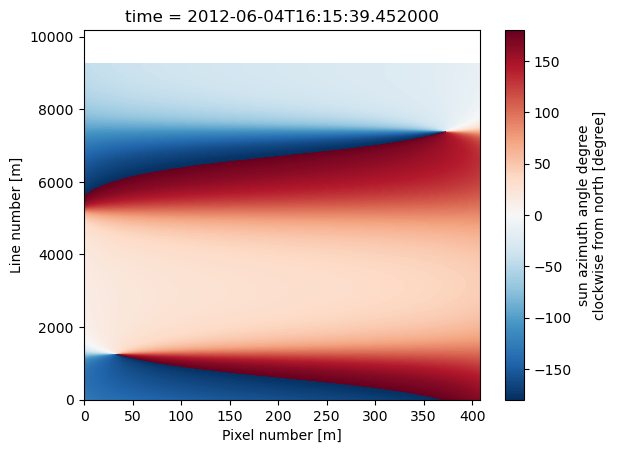

operands could not be broadcast together with shapes (10180,409) (12000,409) 
E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T1615394Z_20120604T1740289Z.nc Fail
E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T1740294Z_20120604T1923089Z.nc
Sun Azimuth


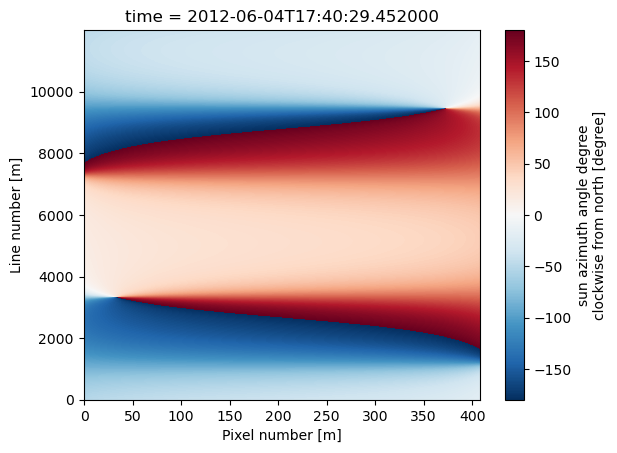

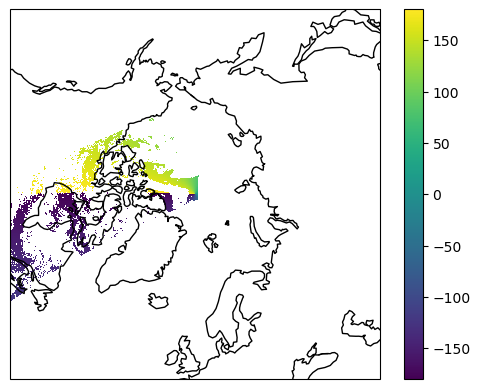

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T17:40:29
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


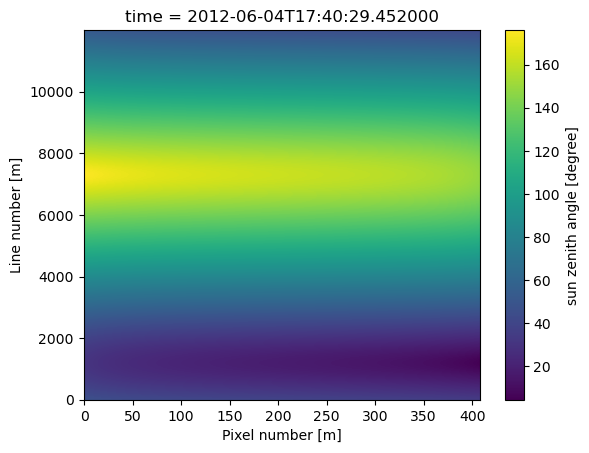

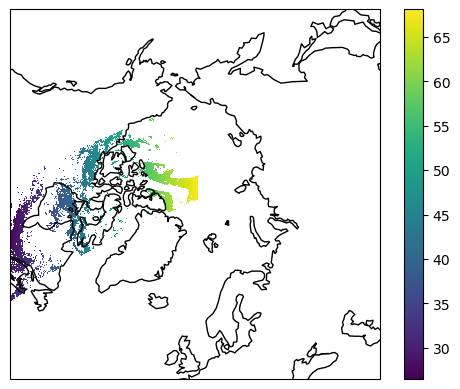

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T17:40:29
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


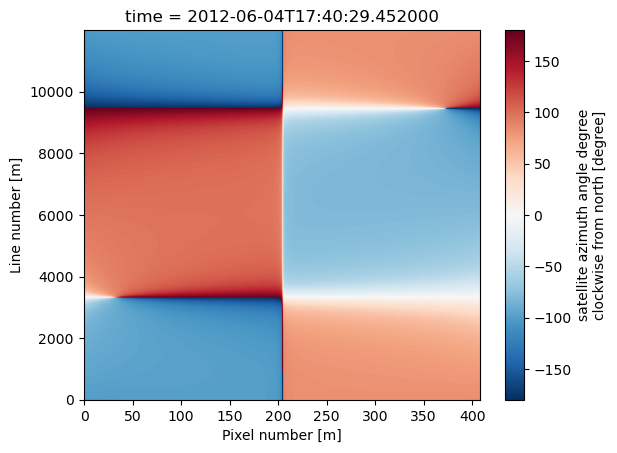

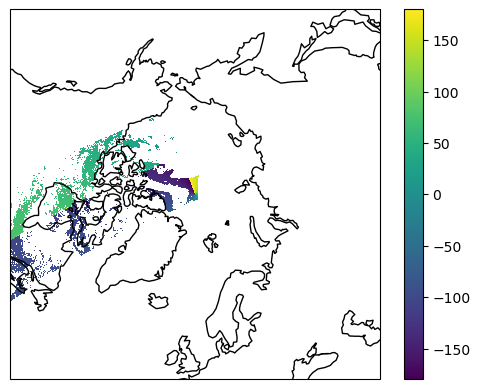

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T17:40:29
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


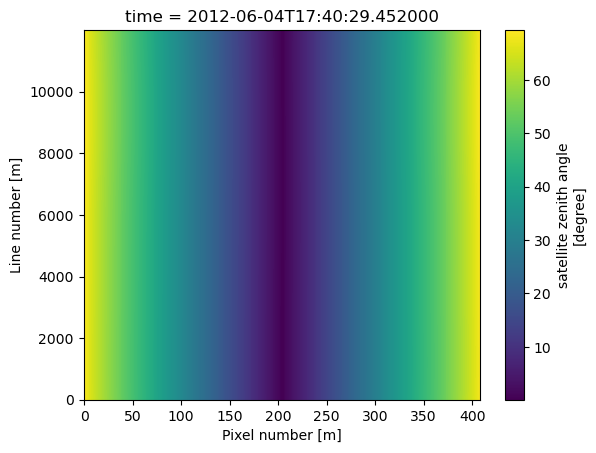

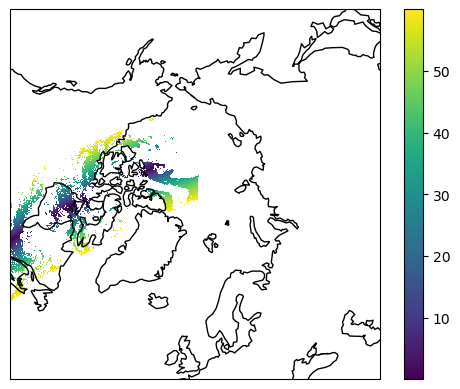

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T17:40:29
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_no

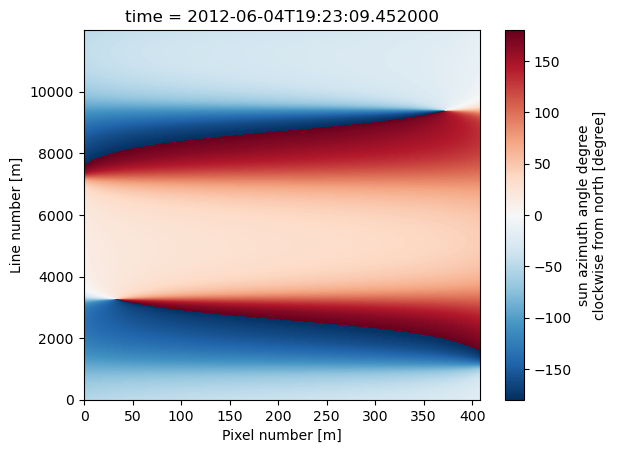

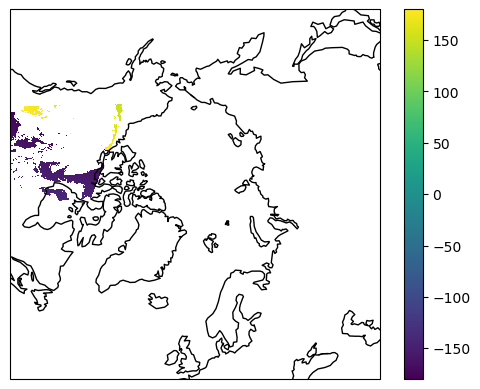

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T19:23:09
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Sun Zenith


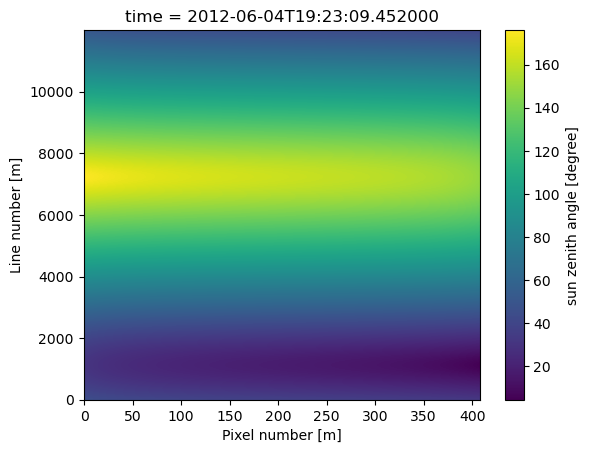

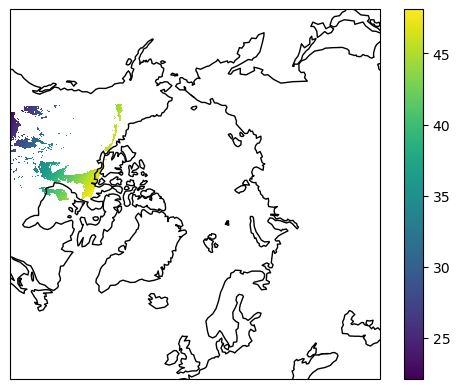

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'sun_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T19:23:09
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Azimuth


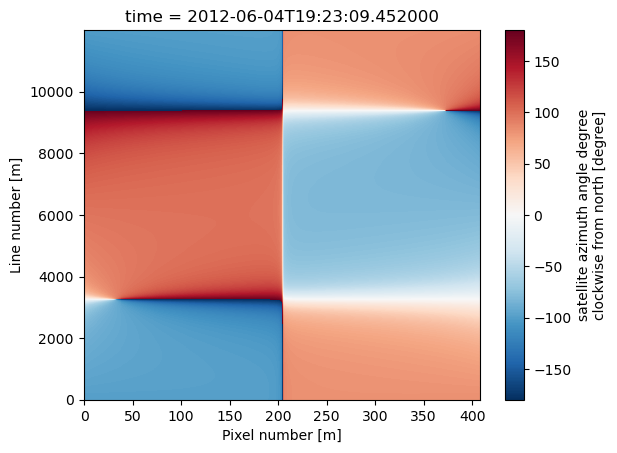

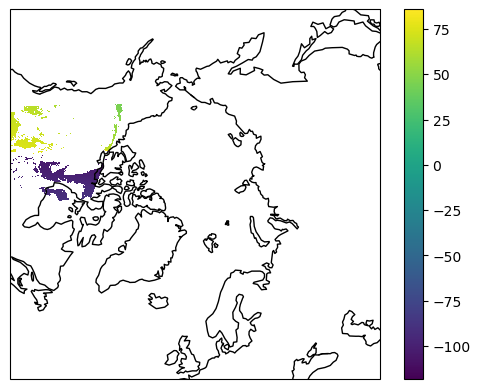

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_azimuth' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T19:23:09
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Satellite Zenith


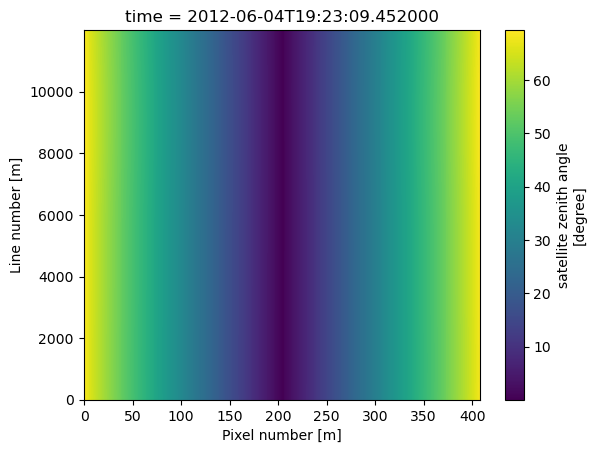

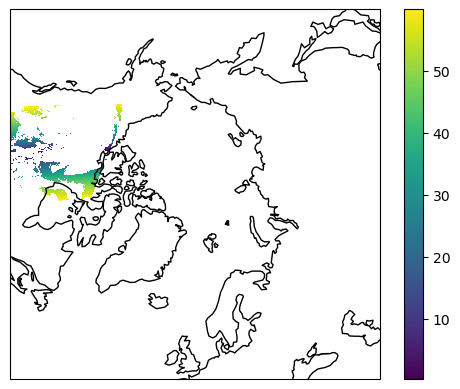

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'satellite_zenith' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T19:23:09
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x


C:\Users\pekkala\AppData\Local\mambaforge\lib\site-packages\xarray\coding\times.py:254: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T2112244Z_20120604T2253589Z.nc
Sun Azimuth


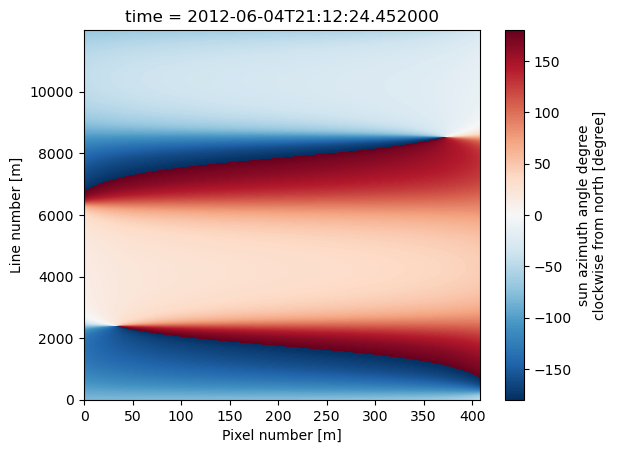

operands could not be broadcast together with shapes (12000,409) (7922,409) 
E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T2112244Z_20120604T2253589Z.nc Fail
list index out of range
E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19/S_NWC_avhrr_noaa19_99999_20120604T2112244Z_20120604T2253589Z.nc Fail


In [185]:
#Create list for the data

combined_list_GEOM = []

for i, SALfile in enumerate(SALfiles):
    try:

        mask = masks[i]
        SAL = xr.open_dataset(SALfile)
        SALtime = pd.to_datetime(SALfile.split('99999_')[1].split('_')[0][:-2])


        PPSfile = 'E:/Data_201206/PPS/gac_nc_import_PPS_201206_noaa19' + '/S_NWC_avhrr' + SALfile.split('S_NWC')[1].split('_bb_')[0] + '.nc'
        PPS = xr.open_dataset(PPSfile)
        print(PPSfile)
        

        #Choosing Sun azimuth data

        sun_az = PPS['sunazimuth'].squeeze()[0:max_overpass_length,:]
        sun_az.plot()
        plt.show()


        #Sun Azimuth datan masking


    
        sun_az_mask = sun_az*mask

        #Sun azimuth data reprojection

        tgt  = pyresample.area_config.create_area_def('nhease2', 'epsg:6931', width=360, height=360, resolution=25000, area_extent= (-4487500.0, -4487500.0, 4487500.0, 4487500.0))
    
        tgt_lon, tgt_lat = tgt.get_lonlats()
        
    
        source = pyresample.SwathDefinition(lats=SAL['latitude'].squeeze()[0:max_overpass_length,:], lons=SAL['longitude'].squeeze()[0:max_overpass_length,:])
    
        reproj_sun_az_mask = pyresample.kd_tree.resample_nearest(source, sun_az_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_sun_az_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_sun_az_mask_xr = xr.DataArray(reproj_sun_az_mask, dims=(('y','x')))
        print(reproj_sun_az_mask_xr)
        reproj_sun_az_mask_xr['time'] = SALtime
        reproj_sun_az_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_sun_az_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_sun_az_mask_xr.name = 'sun_azimuth'
        print(reproj_sun_az_mask_xr)



        

        #Choosing Sun zenith data

        sun_ze = PPS['sunzenith'].squeeze()[0:max_overpass_length,:]
        sun_ze.plot()
        plt.show()



        #Sun zenith data masking
    
        sun_ze_mask = sun_ze*mask

        #Sun zenith dat reprojection
    
        reproj_sun_ze_mask = pyresample.kd_tree.resample_nearest(source, sun_ze_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_sun_ze_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_sun_ze_mask_xr = xr.DataArray(reproj_sun_ze_mask, dims=(('y','x')))
        print(reproj_sun_ze_mask_xr)
        reproj_sun_ze_mask_xr['time'] = SALtime
        reproj_sun_ze_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_sun_ze_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_sun_ze_mask_xr.name = 'sun_zenith'
        print(reproj_sun_ze_mask_xr)


        
        
        #Choosing satellite azimuth data

        print("Satellite Azimuth")

        sat_az = PPS['satazimuth'].squeeze()[0:max_overpass_length,:]
        sat_az.plot()
        plt.show()



        #Satellite zenith data masking
    
    
        sat_az_mask = sat_az*mask

        #Satllite zenith data reprojection
    
        reproj_sat_az_mask = pyresample.kd_tree.resample_nearest(source, sat_az_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_sat_az_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_sat_az_mask_xr = xr.DataArray(reproj_sat_az_mask, dims=(('y','x')))
        print(reproj_sat_az_mask_xr)
        reproj_sat_az_mask_xr['time'] = SALtime
        reproj_sat_az_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_sat_az_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_sat_az_mask_xr.name = 'satellite_azimuth'
        print(reproj_sat_az_mask_xr)



        
    
        #Choosing satellite zenith data

        print("Satellite Zenith")

        sat_ze = PPS['satzenith'].squeeze()[0:max_overpass_length,:]
        sat_ze.plot()
        plt.show()



        #Satellite zenith data masking
    
    
        sat_ze_mask = sat_ze*mask

        #Satellite datan reprojection
        
    
        reproj_sat_ze_mask = pyresample.kd_tree.resample_nearest(source, sat_ze_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_sat_ze_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_sat_ze_mask_xr = xr.DataArray(reproj_sat_ze_mask, dims=(('y','x')))
        print(reproj_sat_ze_mask_xr)
        reproj_sat_ze_mask_xr['time'] = SALtime
        reproj_sat_ze_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_sat_ze_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_sat_ze_mask_xr.name = 'satellite_zenith'
        print(reproj_sat_ze_mask_xr)

        

    #If reading or reprojection fails, save the file name in a separate list. Add empty DataArray to the Dataset. Raise can also be used to find possible errors.
    except Exception as e:
        save_path2 = 'path'
        with open(save_path2 + 'Broken_data_GEOM.txt', 'a') as f:
            f.write(",")
            f.write(timestamp)
            f.close()
        EmptyArray = xr.DataArray(np.ones(tgt_lon.shape)*np.nan, dims=['y','x'])
        EmptyArray['time'] = SALtime
        EmptyArray['lon'] = (('y','x'), tgt_lon)
        EmptyArray['lat'] = (('y','x'), tgt_lat)
        combined_list_GEOM.append(EmptyArray)
        #raise
        continue





    #Combine four DataArrays in a single Dataset

    
    combine_GEOM_data_xr = xr.merge([reproj_sun_az_mask_xr, reproj_sun_ze_mask_xr, reproj_sat_az_mask_xr, reproj_sat_ze_mask_xr])

    combined_list_GEOM.append(combine_GEOM_data_xr)

Open file containing atmospheric variables (NCW file), choose desired values, use masks to aquire the correct data, reproject results and save them in DataSet

E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa19_99999_20120604T0000004Z_20120604T0048399Z.nc
Vesihöyry


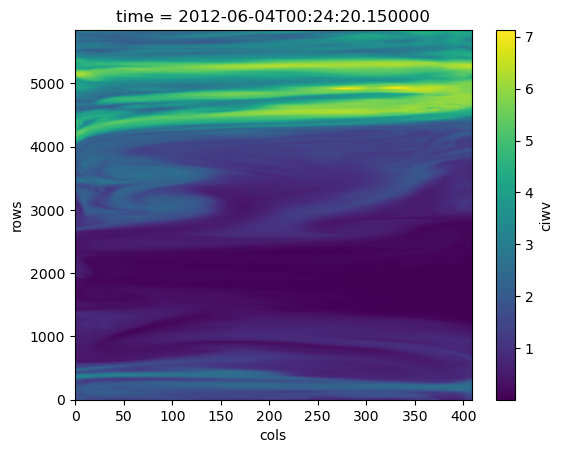

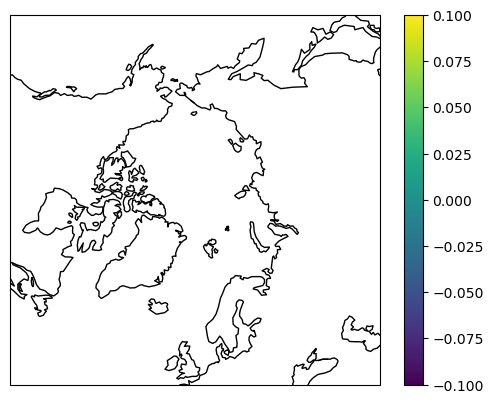

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


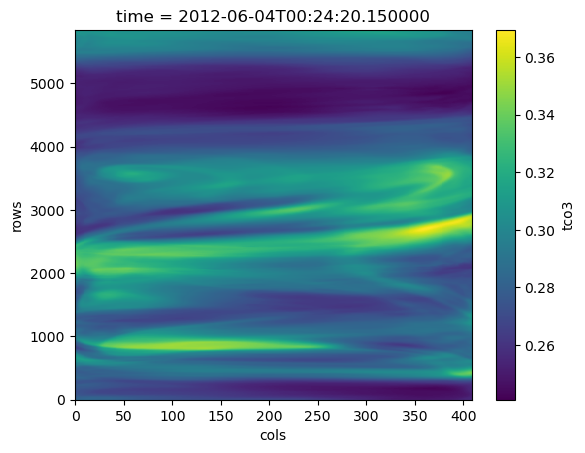

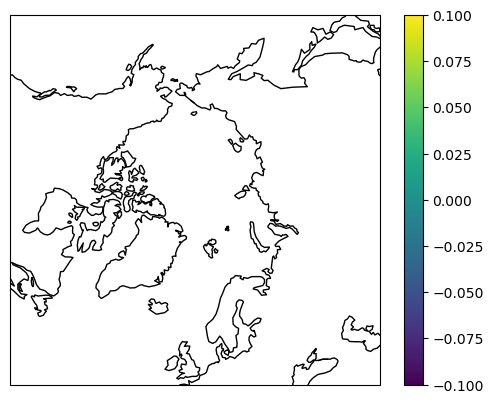

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


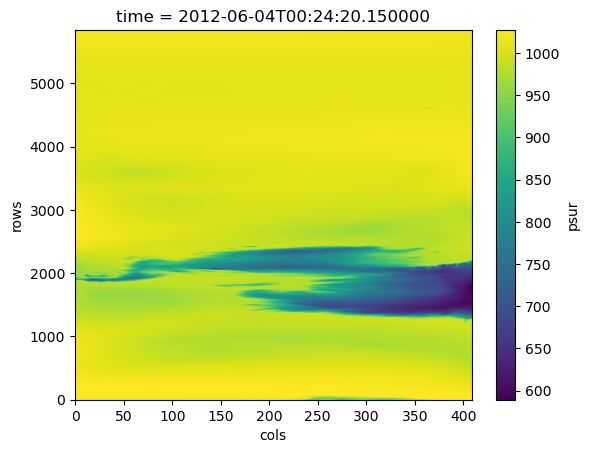

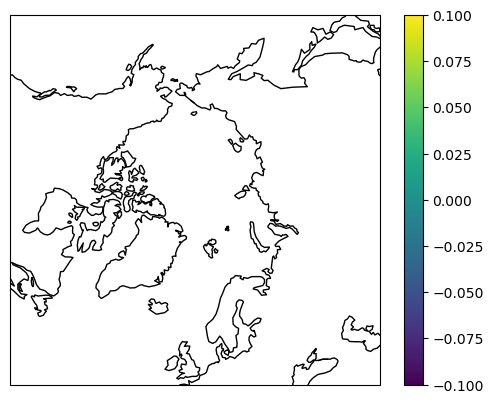

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa19_99999_

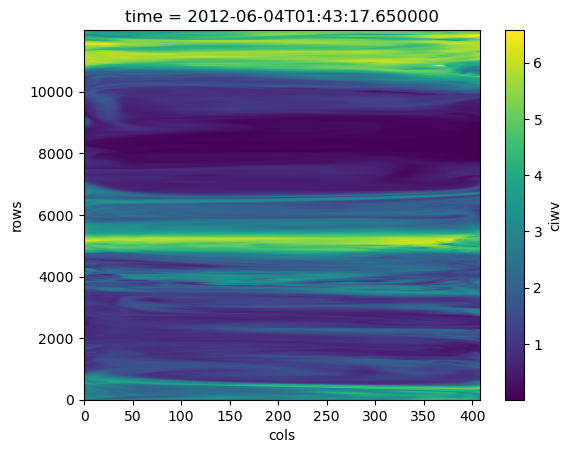

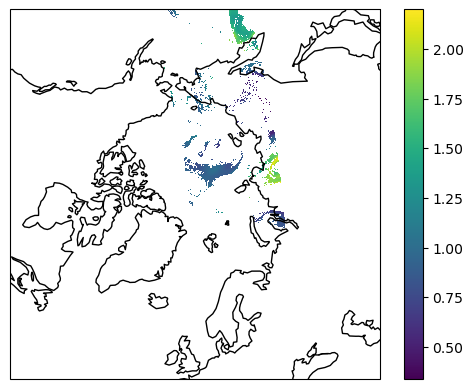

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T00:48:40
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


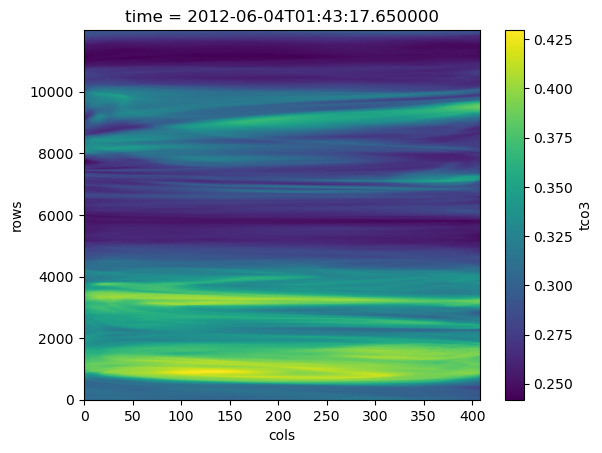

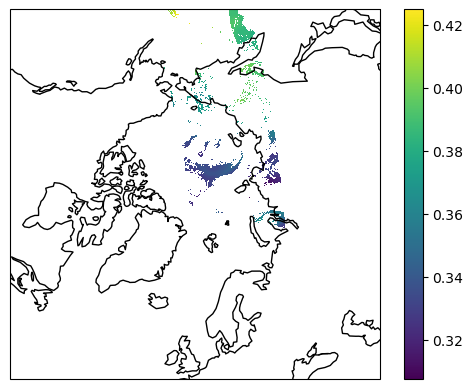

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T00:48:40
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


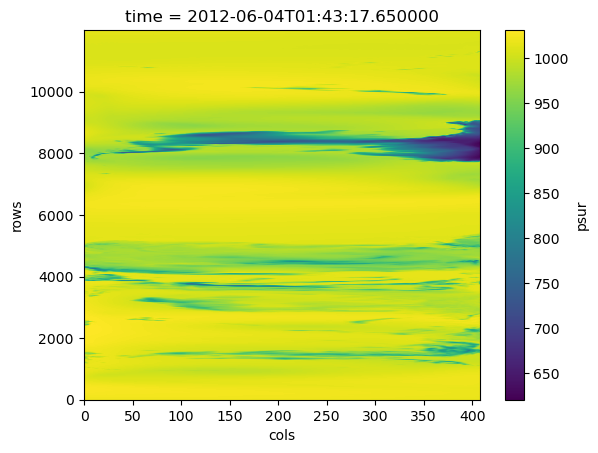

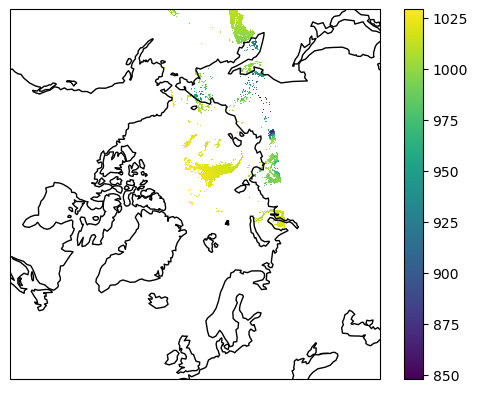

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T00:48:40
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

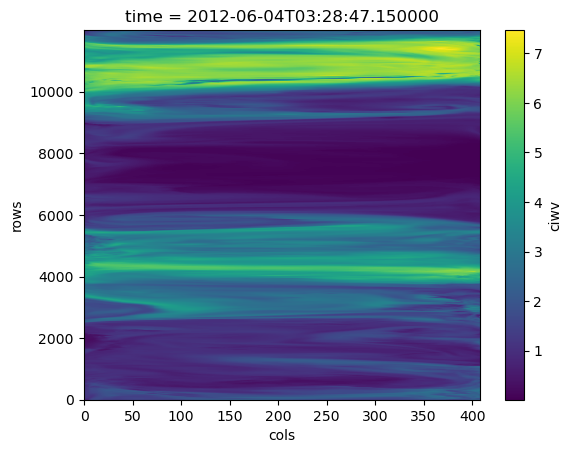

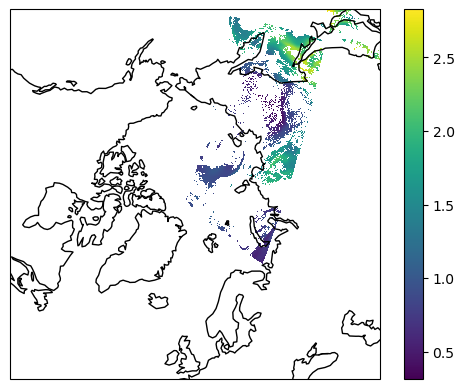

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T02:37:55
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


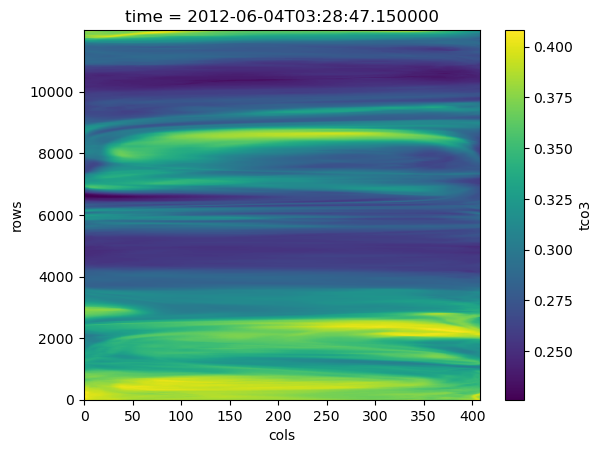

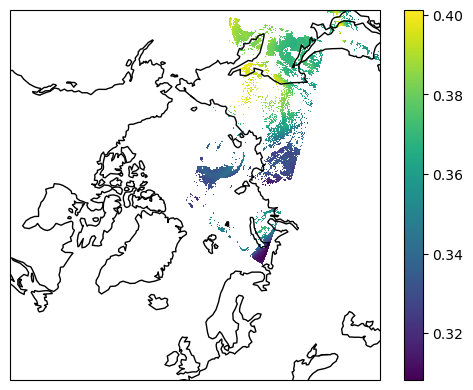

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T02:37:55
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


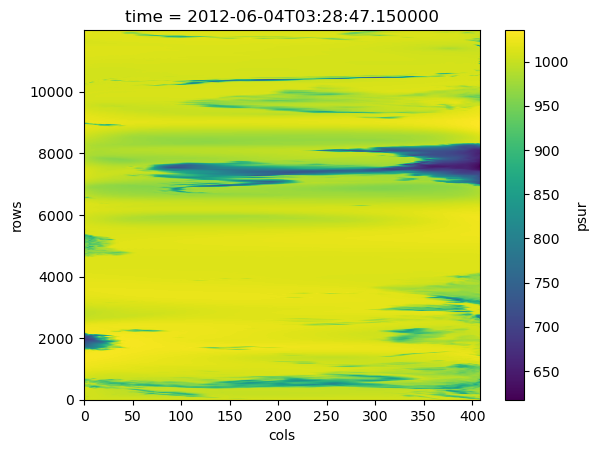

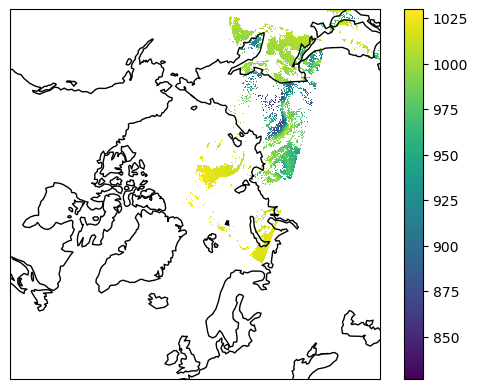

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T02:37:55
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

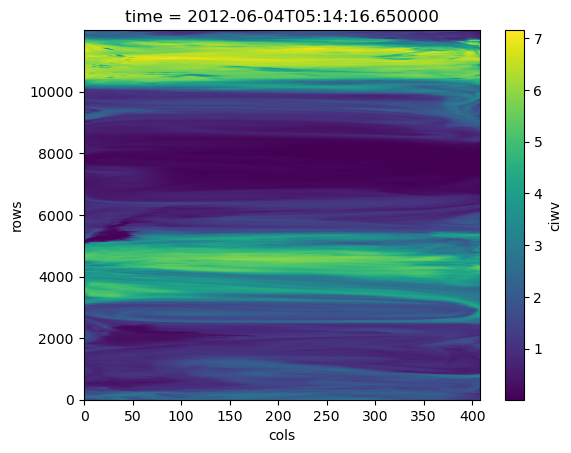

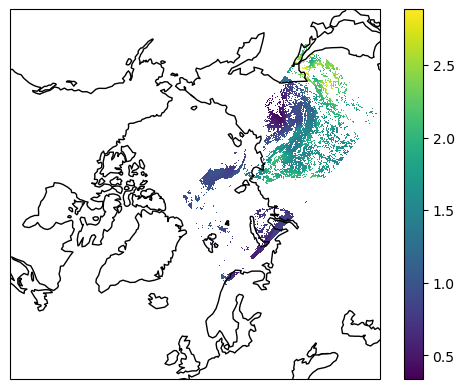

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T04:19:39
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


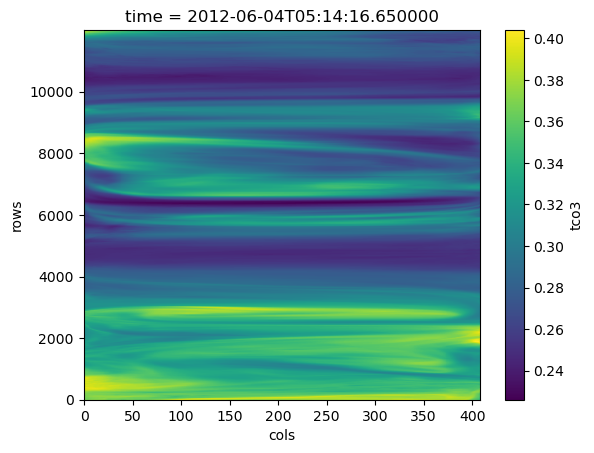

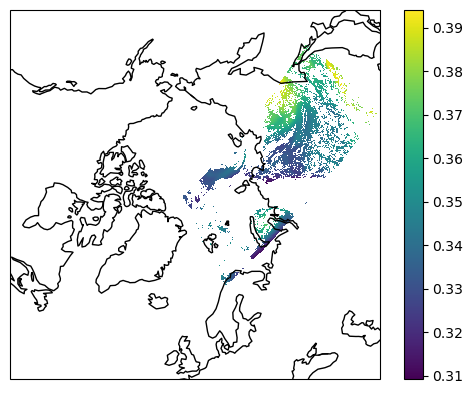

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T04:19:39
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


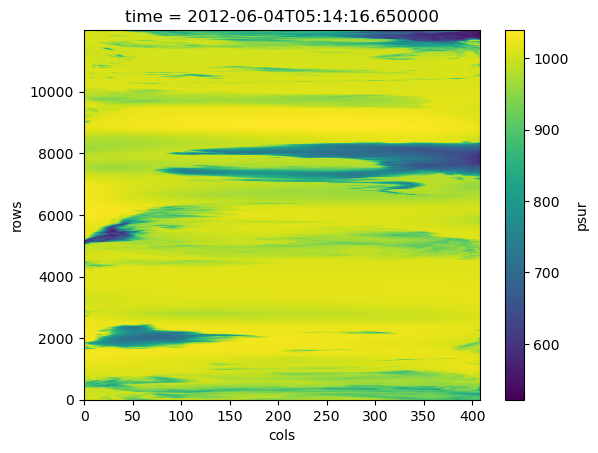

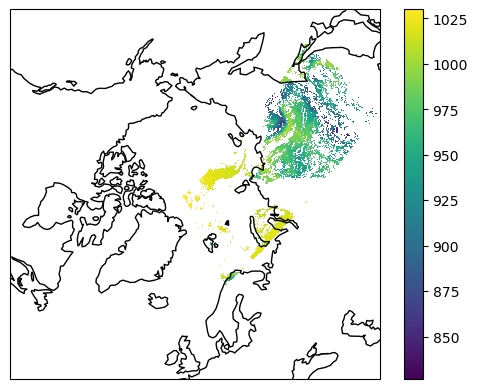

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T04:19:39
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

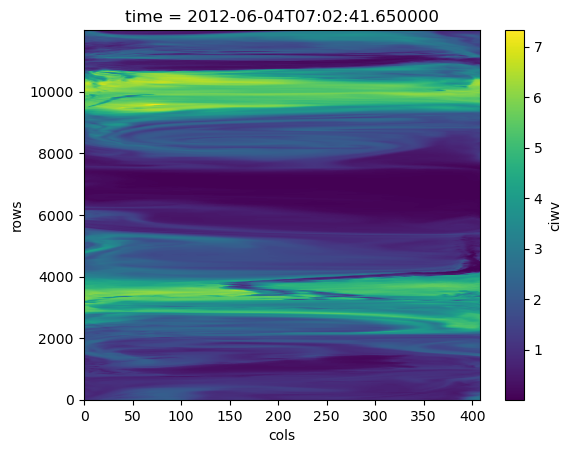

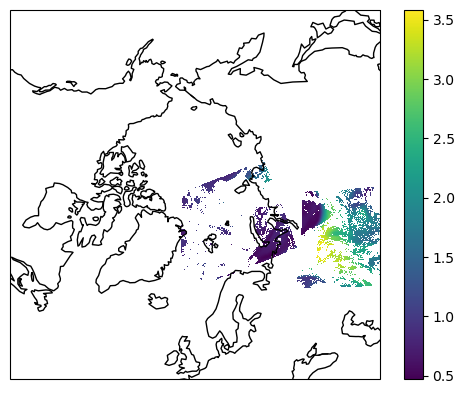

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T06:08:54
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


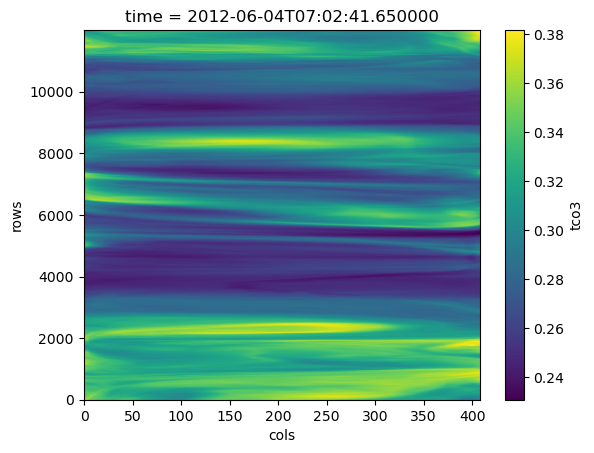

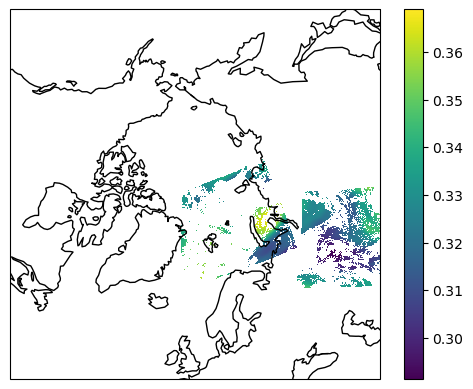

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T06:08:54
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


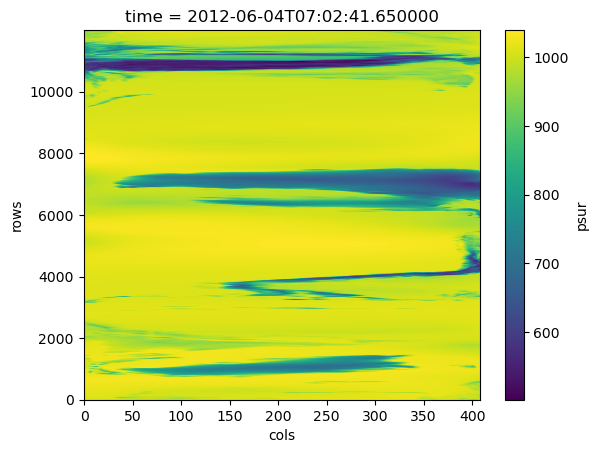

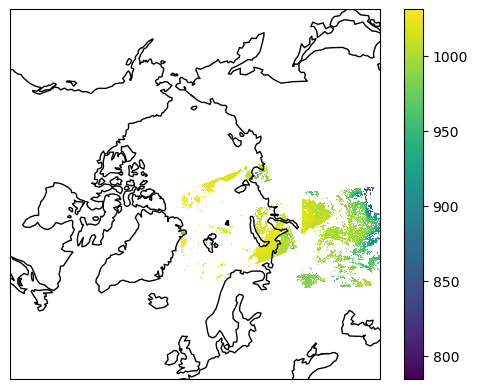

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T06:08:54
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

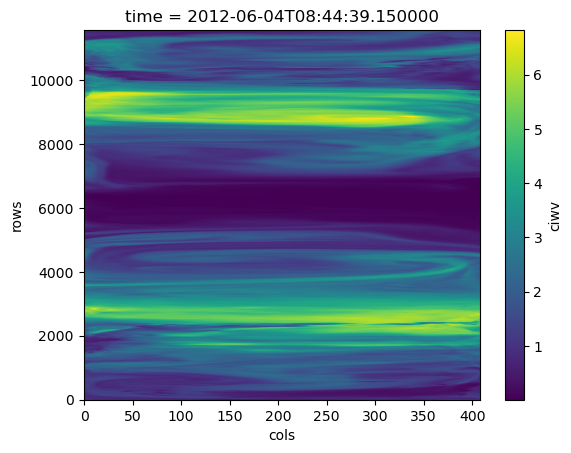

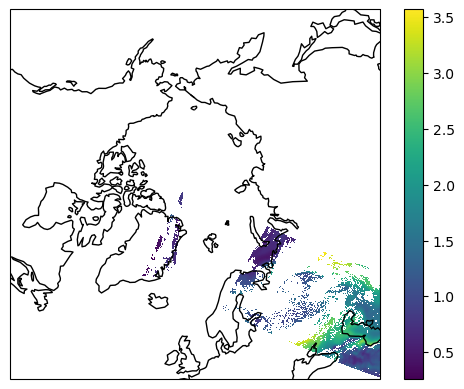

<xarray.DataArray (y: 360, x: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [       nan,        nan,        nan, ..., 0.80699998, 0.773     ,
        0.77200001],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
     

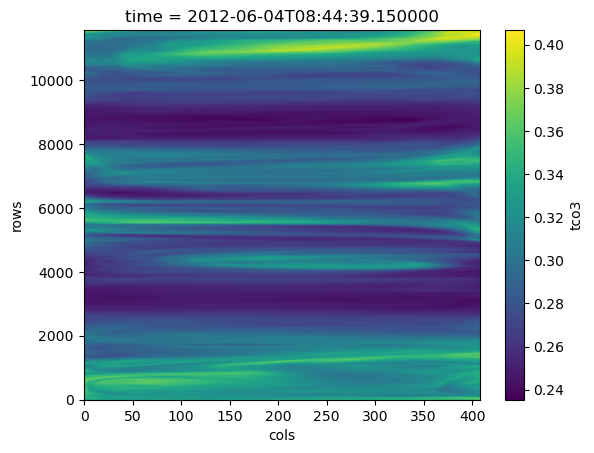

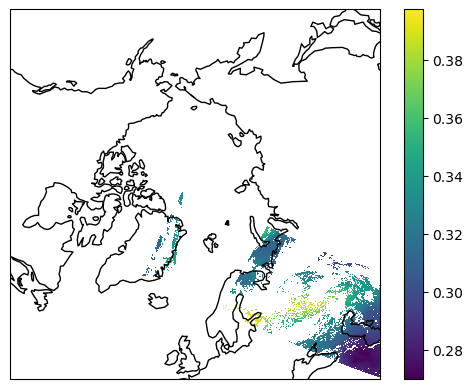

<xarray.DataArray (y: 360, x: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [       nan,        nan,        nan, ..., 0.28019053, 0.2806575 ,
        0.28159148],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [    

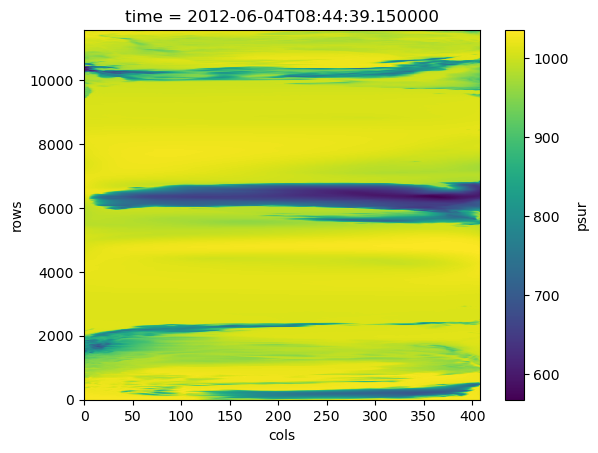

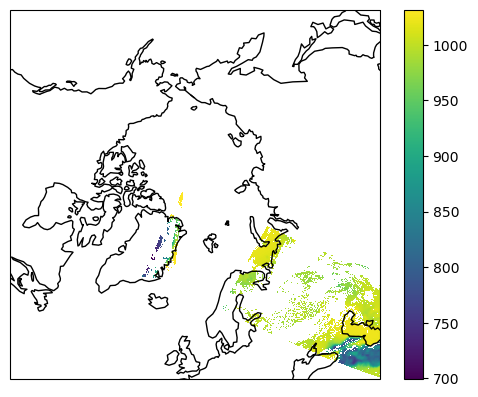

<xarray.DataArray (y: 360, x: 360)>
array([[         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       ...,
       [         nan,          nan,          nan, ..., 997.69995117,
        995.39996338, 995.29998779],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [   

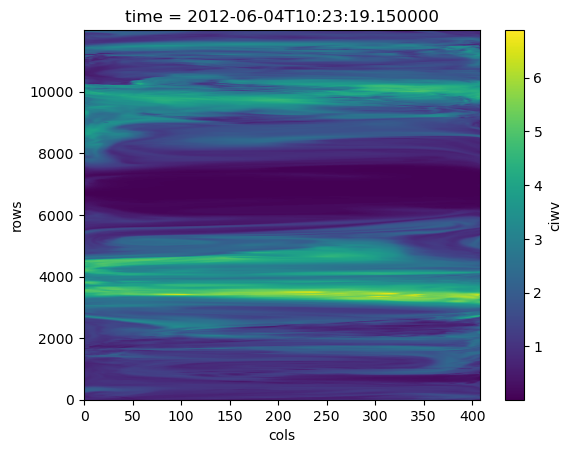

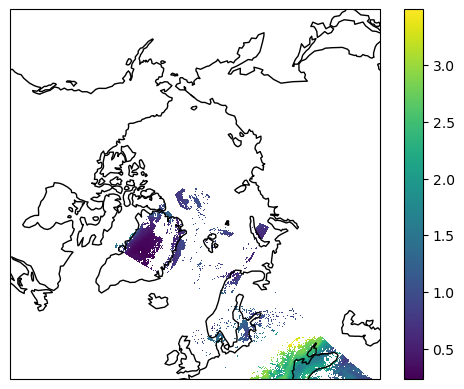

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T09:32:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


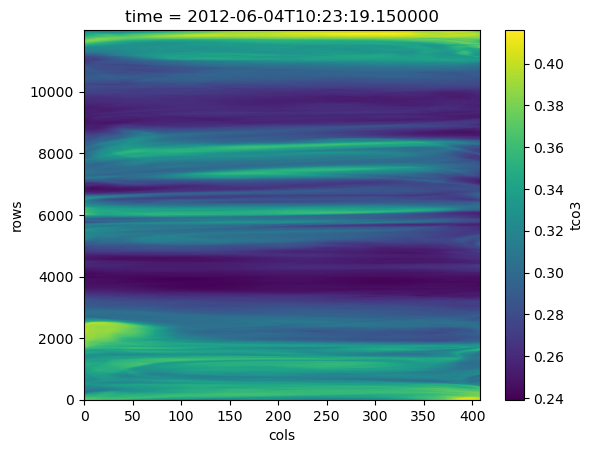

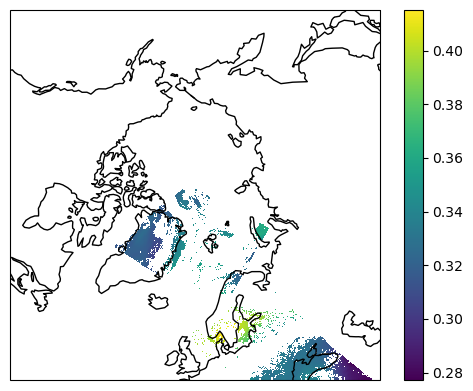

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T09:32:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


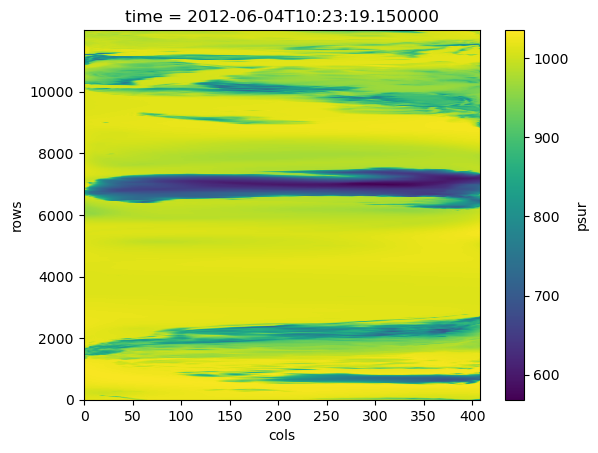

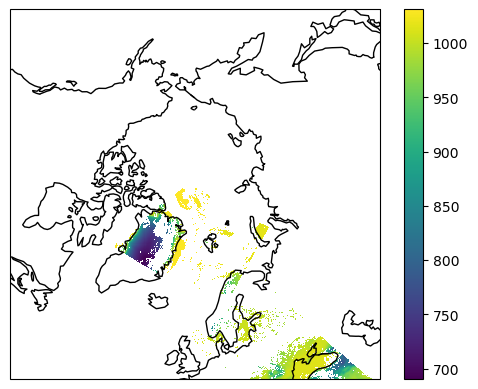

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T09:32:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

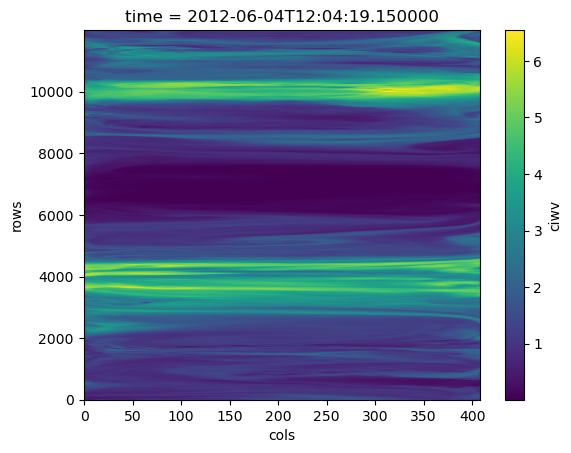

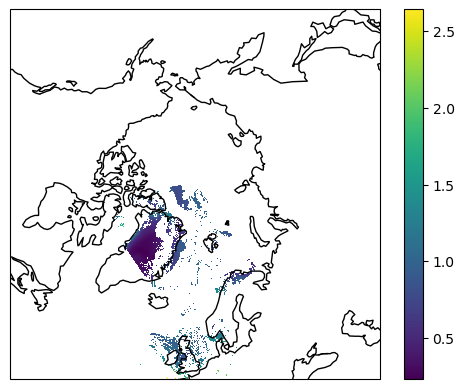

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T11:13:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


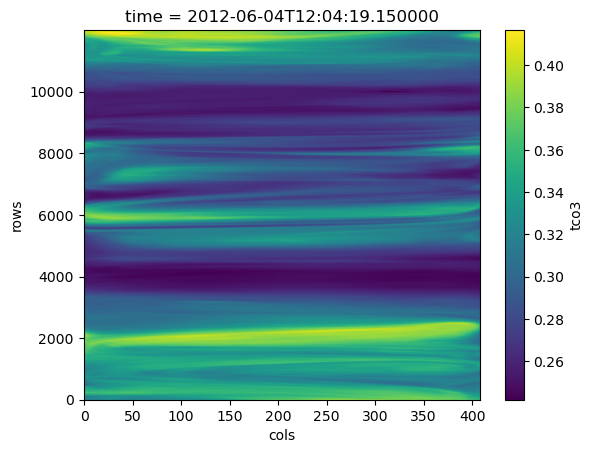

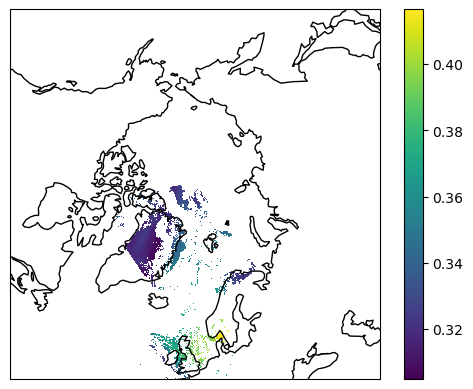

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T11:13:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


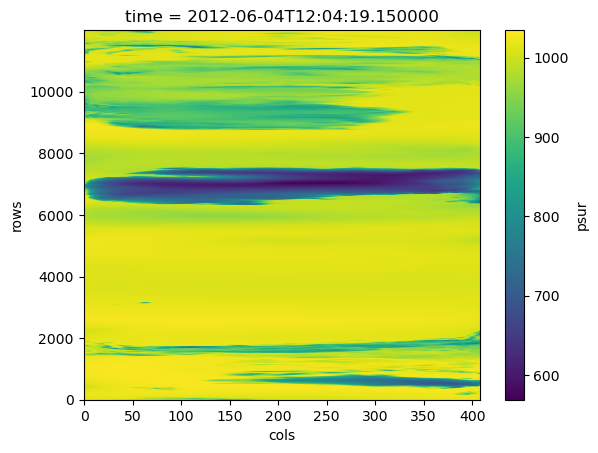

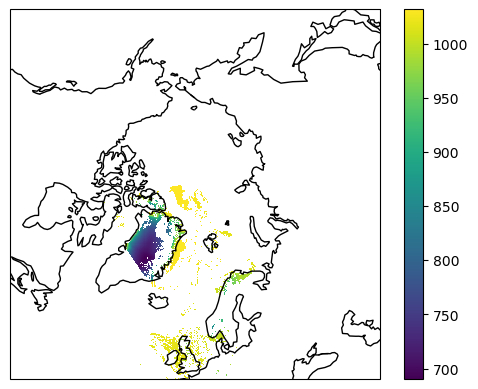

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T11:13:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

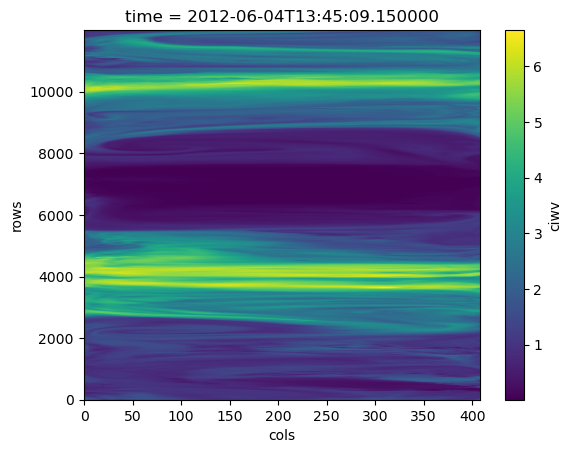

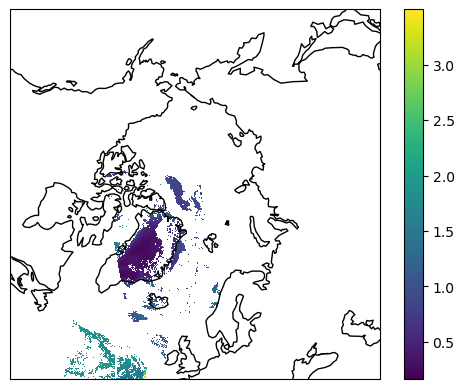

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T12:54:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


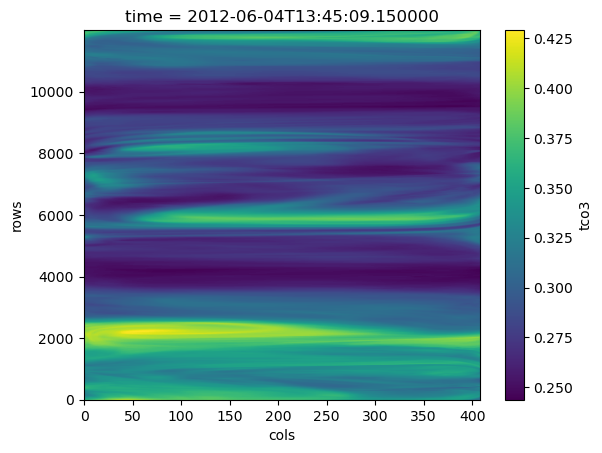

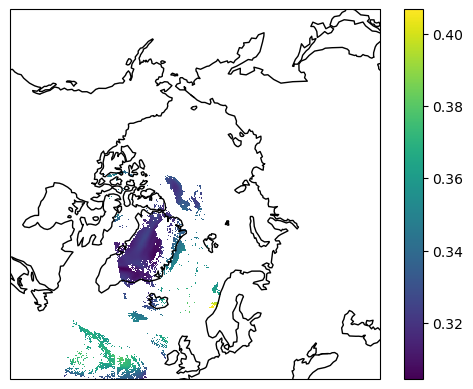

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T12:54:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


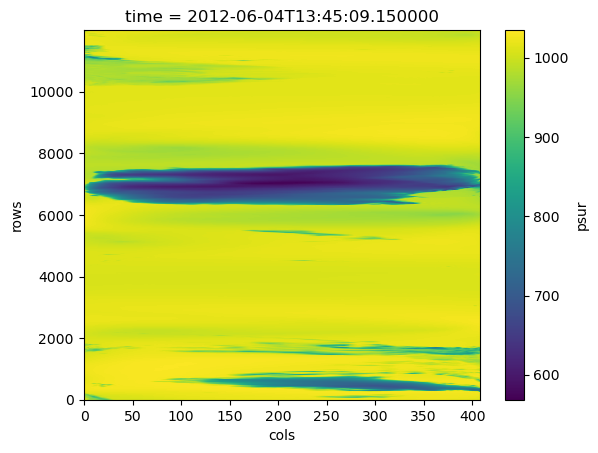

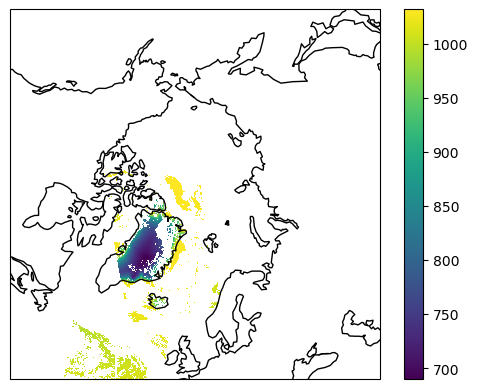

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T12:54:49
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

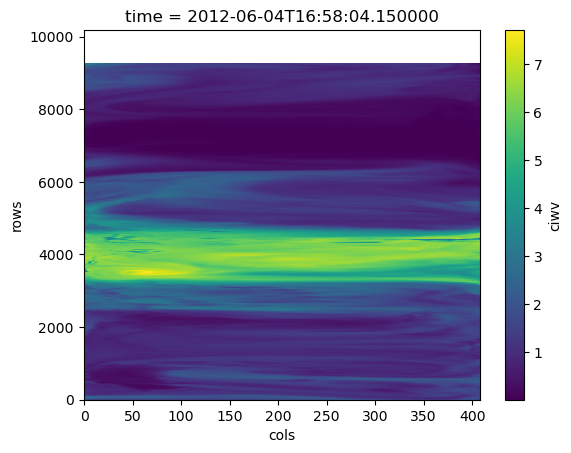

E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa19_99999_20120604T1740294Z_20120604T1923089Z.nc
Vesihöyry


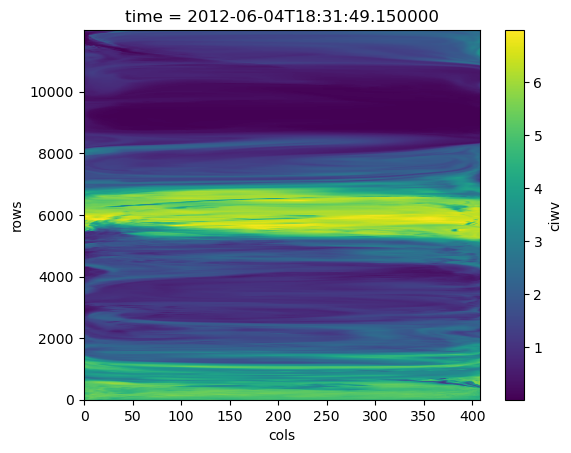

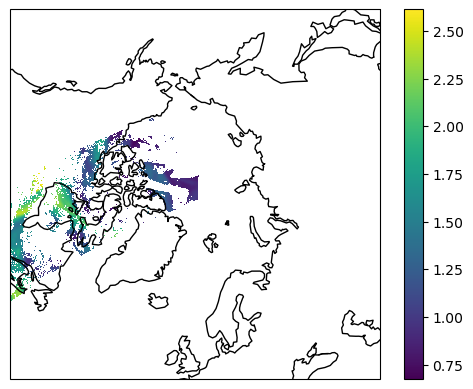

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T17:40:29
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


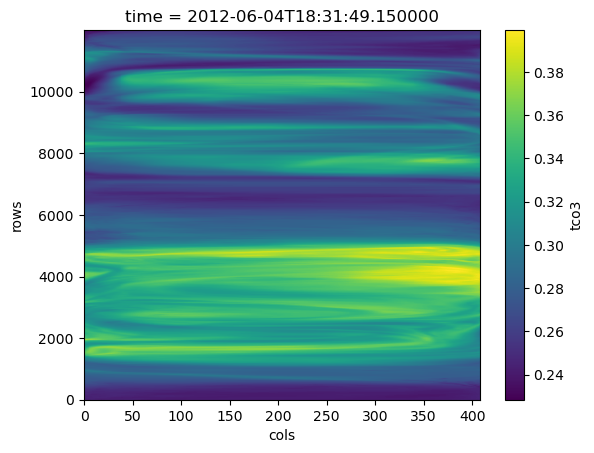

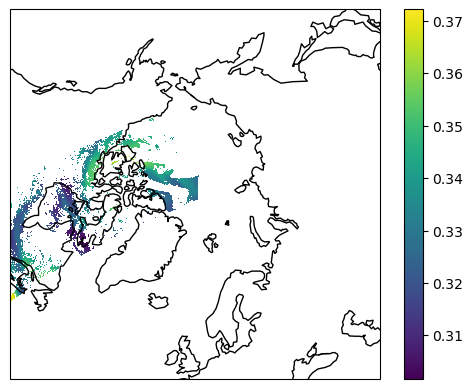

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T17:40:29
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


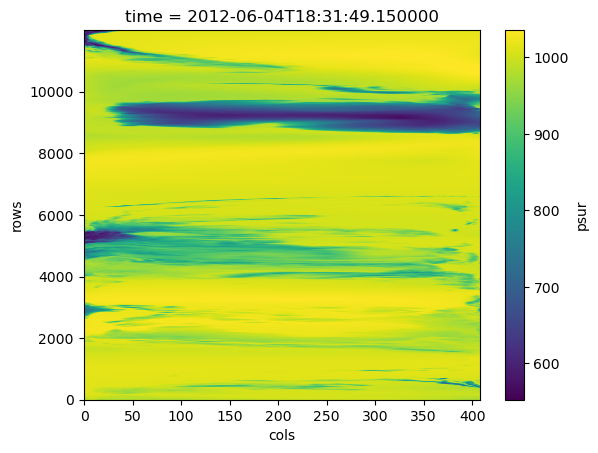

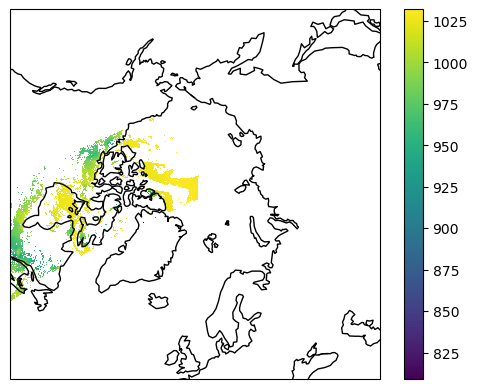

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T17:40:29
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

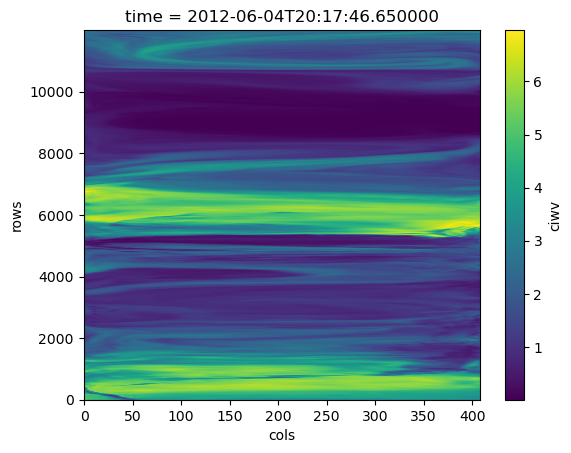

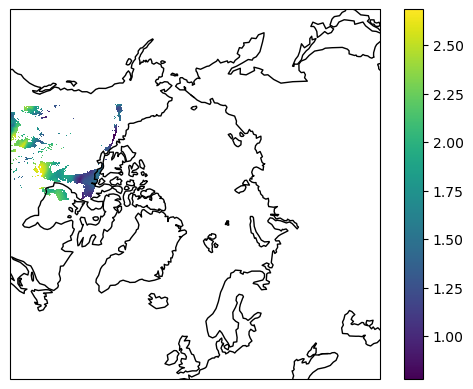

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Water_vapour' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T19:23:09
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Otsoni


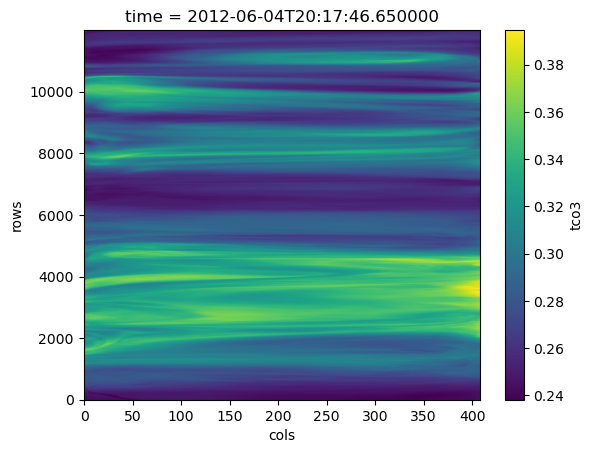

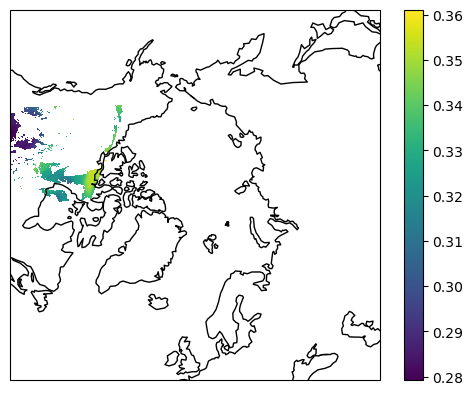

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Ozone' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T19:23:09
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
Pintapaine


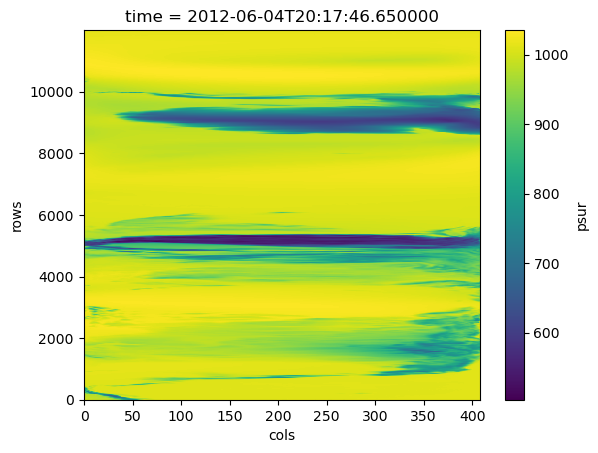

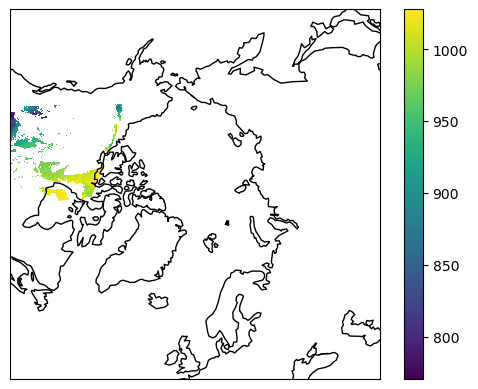

<xarray.DataArray (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Dimensions without coordinates: y, x
<xarray.DataArray 'Surface_pressure' (y: 360, x: 360)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time     datetime64[ns] 2012-06-04T19:23:09
    lon      (y, x) float64 -135.0 -135.2 -135.3 -135.5 ... 44.68 44.84 45.0
    lat      (y, x) float64 30.55 30.73 30.92 31.1 ... 31.1 30.92 30.73 30.55
Dimensions without coordinates: y, x
E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19/S_NWC_nwp_noaa

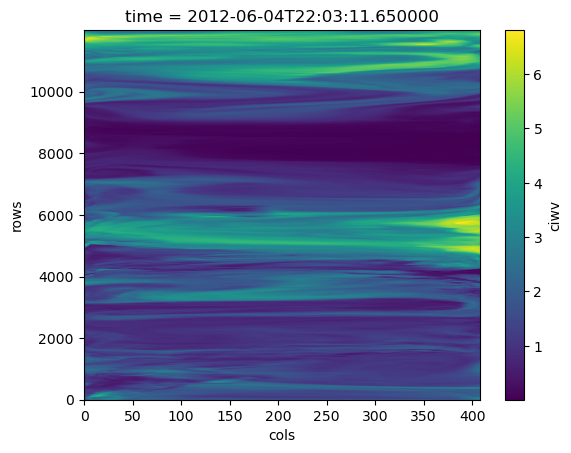

In [186]:
#Create list for the data

combined_list_ATM = []

for i, SALfile in enumerate(SALfiles):
    try:
        mask = masks[i]
        SAL = xr.open_dataset(SALfile)
        SALtime = pd.to_datetime(SALfile.split('99999_')[1].split('_')[0][:-2])

        SCWfile = 'E:/Data_201206/NWP/gac_nc_import_NWP_201206_noaa19' + '/S_NWC_nwp' + SALfile.split('S_NWC')[1].split('_bb_')[0] + '.nc'
        SCW = xr.open_dataset(SCWfile)
        print(SCWfile)
        SCW = SCW.rename_dims({'ny':'rows','nx':'cols'})


        ##Choosing water vapour data

        
        ciwv_raw = SCW['ciwv'].squeeze()[0:max_overpass_length,:]
        ciwv = ciwv_raw * 0.1 ##vesihöyry
        #ciwv = ciwv.squeeze()[0:max_overpass_length,:]
        ciwv.plot()
        plt.show()


        #Water vapour data masking
    
    
        ciwv_mask = ciwv*mask
        

        #Water vapour data reprojection

        tgt  = pyresample.area_config.create_area_def('nhease2', 'epsg:6931', width=360, height=360, resolution=25000, area_extent= (-4487500.0, -4487500.0, 4487500.0, 4487500.0))
    
        tgt_lon, tgt_lat = tgt.get_lonlats()
        
    
        source = pyresample.SwathDefinition(lats=SAL['latitude'].squeeze()[0:max_overpass_length,:], lons=SAL['longitude'].squeeze()[0:max_overpass_length,:])
    
        reproj_ciwv_mask = pyresample.kd_tree.resample_nearest(source, ciwv_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_ciwv_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.savefig('output-2.png')
        plt.show()
    
        reproj_ciwv_mask_xr = xr.DataArray(reproj_ciwv_mask, dims=(('y','x')))
        print(reproj_ciwv_mask_xr)
        reproj_ciwv_mask_xr['time'] = SALtime
        reproj_ciwv_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_ciwv_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_ciwv_mask_xr.name = 'Water_vapour'
        print(reproj_ciwv_mask_xr)



        #Choosing ozone data


        tco3_raw = SCW['tco3'].squeeze()[0:max_overpass_length,:]
        tco3 = tco3_raw / 0.021414 ##otsoni
        tco3.plot()
        plt.show()

        

        #ozone data masking
    
    
        tco3_mask = tco3*mask
        

        #ozone data reprojection

        tgt  = pyresample.area_config.create_area_def('nhease2', 'epsg:6931', width=360, height=360, resolution=25000, area_extent= (-4487500.0, -4487500.0, 4487500.0, 4487500.0))
    
        tgt_lon, tgt_lat = tgt.get_lonlats()
        
    
        reproj_tco3_mask = pyresample.kd_tree.resample_nearest(source, tco3_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_tco3_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_tco3_mask_xr = xr.DataArray(reproj_tco3_mask, dims=(('y','x')))
        print(reproj_tco3_mask_xr)
        reproj_tco3_mask_xr['time'] = SALtime
        reproj_tco3_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_tco3_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_tco3_mask_xr.name = 'Ozone'
        print(reproj_tco3_mask_xr)





        #Choosing surface pressure data


        psur_raw = SCW['psur'].squeeze()[0:max_overpass_length,:]
        psur = psur_raw * 0.01 ##pintapaine
        psur.plot()
        plt.show()

        

        #Surface pressure data masking
    
    
        psur_mask = psur*mask
        

        #Surface pressure data reprojection

        tgt  = pyresample.area_config.create_area_def('nhease2', 'epsg:6931', width=360, height=360, resolution=25000, area_extent= (-4487500.0, -4487500.0, 4487500.0, 4487500.0))
    
        tgt_lon, tgt_lat = tgt.get_lonlats()
        
    
        reproj_psur_mask = pyresample.kd_tree.resample_nearest(source, psur_mask.squeeze().values, tgt, radius_of_influence=30000, fill_value=np.nan)
    
    
        ax = plt.axes(projection=ccrs.LambertAzimuthalEqualArea(central_latitude=90))
        ax.coastlines()
        image = ax.pcolormesh(tgt_lon, tgt_lat, reproj_psur_mask, transform=ccrs.PlateCarree())
        plt.colorbar(image)
        plt.show()
    
        reproj_psur_mask_xr = xr.DataArray(reproj_psur_mask, dims=(('y','x')))
        print(reproj_psur_mask_xr)
        reproj_psur_mask_xr['time'] = SALtime
        reproj_psur_mask_xr['lon'] = (('y','x'), tgt_lon)
        reproj_psur_mask_xr['lat'] = (('y','x'), tgt_lat)
        reproj_psur_mask_xr.name = 'Surface_pressure'
        print(reproj_psur_mask_xr)
        

    #If reading or reprojection fails, save the file name in a separate list. Add empty DataArray to the Dataset. Raise can also be used to find possible errors.
    except Exception:
        print(timestamp)
        save_path2 = 'path'
        with open(save_path2 + 'Broken_data_ATM.txt', 'a') as f:
            f.write(",")
            f.write(timestamp)
            f.close()
        EmptyArray = xr.DataArray(np.ones(tgt_lon.shape)*np.nan, dims=['y','x'])
        EmptyArray['time'] = SALtime
        EmptyArray['lon'] = (('y','x'), tgt_lon)
        EmptyArray['lat'] = (('y','x'), tgt_lat)
        combined_list_ATM.append(EmptyArray)
        #raise
        continue
        

    #Combine three DataArrays in a single Dataset
 
    combine_ATM_data_xr = xr.merge([reproj_ciwv_mask_xr, reproj_tco3_mask_xr, reproj_psur_mask_xr])

    combined_list_ATM.append(combine_ATM_data_xr)
        


Combine datasets into one stacked dataset and save it as a NetCDF file. If this fails, print the timestamp

In [187]:
length = len(combined_list_albedo)

for i in range(length):
    try:

        dataset_albedo = combined_list_albedo[i]

        dataset_ATM = combined_list_ATM[i]
   
        dataset_GEOM = combined_list_GEOM[i]

    
        combine_data_xr = xr.combine_by_coords(data_objects=[dataset_albedo, dataset_ATM, dataset_GEOM], data_vars='all', coords='different', join='outer', combine_attrs='no_conflicts')
    
    
        timestamp = combine_data_xr['time']
    

        combine_data_xr.to_netcdf(Save_path + 'combined_overpass_' + pd.to_datetime(timestamp.values).strftime('%Y%m%dT%H%M') +  '.nc')


    except Exception:

        print(pd.to_datetime(timestamp.values).strftime('%Y%m%dT%H%M'), "Fail")
    
    continue
    
    


albedo 0
<xarray.Dataset>
Dimensions:           (y: 360, x: 360)
Coordinates:
    time              datetime64[ns] 2012-06-04
    lon               (y, x) float64 -135.0 -135.2 -135.3 ... 44.68 44.84 45.0
    lat               (y, x) float64 30.55 30.73 30.92 ... 30.92 30.73 30.55
Dimensions without coordinates: y, x
Data variables:
    Diff_alb_SAL_TOA  (y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    TOA_alb           (y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    SAL_alb           (y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
<xarray.Dataset>
Dimensions:           (y: 360, x: 360)
Coordinates:
    time              datetime64[ns] 2012-06-04
    lon               (y, x) float64 -135.0 -135.2 -135.3 ... 44.68 44.84 45.0
    lat               (y, x) float64 30.55 30.73 30.92 ... 30.92 30.73 30.55
Dimensions without coordinates: y, x
Data variables:
    Diff_alb_SAL_TOA  (y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
    TOA_alb    